# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

CMAQDATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station"

PM_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

CMAQ_COLS = [
    "NO2_cmaq",
    "O3_cmaq",
    "SO2_cmaq"
]

BASE_FEATURE_COLS = PM_COLS + CMAQ_COLS

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24]
ROLL_WINDOWS = [3, 6, 12, 24]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

RANDOM_STATE = 42

# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
    f.write(f"RANDOM_STATE: {RANDOM_STATE}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/2025_12_17-18_47_59


# Load dataset

## Method

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    if "date" in df.columns:
        df["date"] = pd.to_datetime(df["date"])
    elif "Date" in df.columns and "Time" in df.columns:
        df["date"] = pd.to_datetime((df["Date"] + " " + df["Time"]).astype('datetime64[ns]'), format="%y/%m/%d %H:%M:%S")
        df = df.drop(columns=["Date", "Time"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove "Unnamed" column
    for c in df.columns:
        if "Unnamed:" in c:
            df = df.drop(columns=[c])

    # Add station_id column
    if "Station" not in df.columns:
        df["station_id"] = station_id
    else:
        df = df.rename({"Station": "station_id"}, axis=1)
    return df

## CMAQ data

In [3]:
# Load dataset
dfs_cmaq = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, CMAQDATA_DIR)
    dfs_cmaq.append(df_sid)
df_cmaq = pd.concat(dfs_cmaq, ignore_index=True)

# Rename columns
df_cmaq = df_cmaq.rename({c: f"{c}_cmaq" for c in df_cmaq.columns if c not in ["date", "station_id"]}, axis=1)

# Sort data by station then date
df_cmaq = df_cmaq.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_cmaq = df_cmaq.loc[:, ["date"] + CMAQ_COLS + ["station_id"]]

display(df_cmaq)

# Convert unit
df_cmaq["NO2_cmaq"] = df_cmaq["NO2_cmaq"] * 1883.2
df_cmaq["O3_cmaq"] = df_cmaq["O3_cmaq"] * 1960
df_cmaq["SO2_cmaq"] = df_cmaq["SO2_cmaq"] * 2620

print(df_cmaq.shape)
print(df_cmaq.columns)
df_cmaq

,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.000072,0.096425,0.000027,211
1,2022-01-01 08:00:00,0.000074,0.077419,0.000038,211
2,2022-01-01 09:00:00,0.000055,0.061006,0.000050,211
3,2022-01-01 10:00:00,0.000040,0.048525,0.000057,211
4,2022-01-01 11:00:00,0.000034,0.029449,0.000047,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,0.002276,0.026421,0.000149,216
44852,2022-12-31 02:00:00,0.002208,0.026171,0.000148,216
44853,2022-12-31 03:00:00,0.002249,0.026087,0.000151,216
44854,2022-12-31 04:00:00,0.002680,0.026347,0.000166,216


(44856, 5)
Index(['date', 'NO2_cmaq', 'O3_cmaq', 'SO2_cmaq', 'station_id'], dtype='object')


,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,0.063087,57.721016,0.122092,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,4.285888,51.784937,0.389183,216
44852,2022-12-31 02:00:00,4.157322,51.295325,0.386550,216
44853,2022-12-31 03:00:00,4.235773,51.130547,0.394695,216
44854,2022-12-31 04:00:00,5.047855,51.640614,0.435544,216


## PM data

In [4]:
# Load dataset
dfs_pm = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs_pm.append(df_sid)
df_pm = pd.concat(dfs_pm, ignore_index=True)

# Sort data by station then date
df_pm = df_pm.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_pm = df_pm.loc[:, ["date"] + PM_COLS + ["station_id"]]

print(df_pm.shape)
print(df_pm.columns)
df_pm

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
92962,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
92963,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
92964,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


## Merge 2 data

In [5]:
dfs_all = []
for station in STATION_IDS:
    df_pm_station = df_pm[df_pm["station_id"] == station]
    df_cmaq_station = df_cmaq[df_cmaq["station_id"] == station]
    df_joined = pd.merge(df_pm_station.drop(columns=["station_id"]), df_cmaq_station, on='date', how='inner')
    dfs_all.append(df_joined)
df_all = pd.concat(dfs_all, axis=0).reset_index(drop=True)
df_all

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
43370,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
43371,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
43372,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
43373,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


In [6]:
df_all.isnull().sum()

date                        0
NO2_quantrac            27391
PM25_quantrac           27393
O3_quantrac             30277
CO_quantrac             27407
Temperature_quantrac    35140
Humid_quantrac          35140
NO2_cmaq                    0
O3_cmaq                     0
SO2_cmaq                    0
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [7]:
df_dropped = df_all.dropna().reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Update the STATION_IDS after dropping missing

In [8]:
STATION_IDS = list(df_dropped["station_id"].unique())
STATION_IDS

[211, 212, 213, 216]

## Visualization

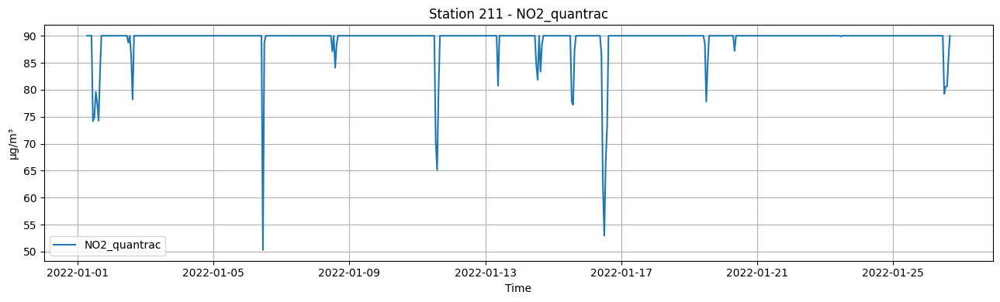

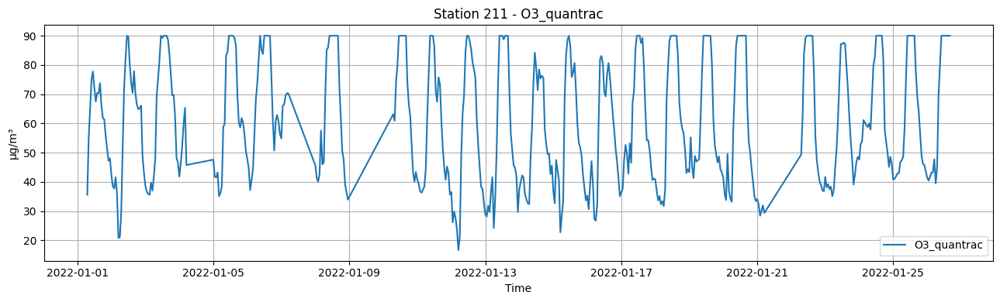

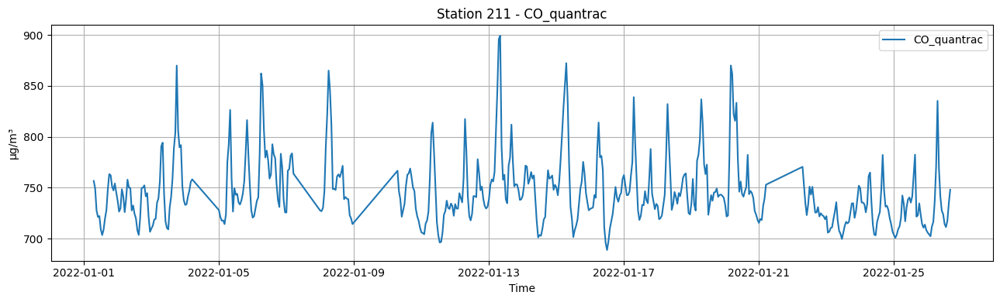

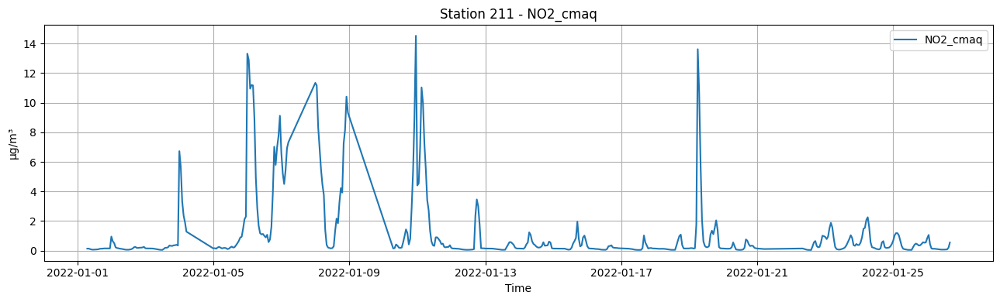

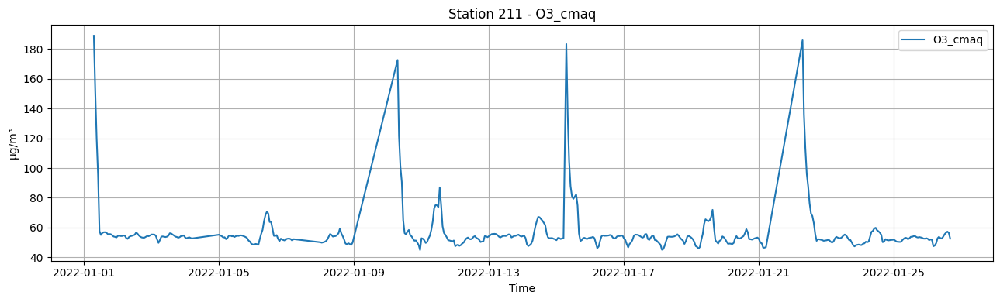

...

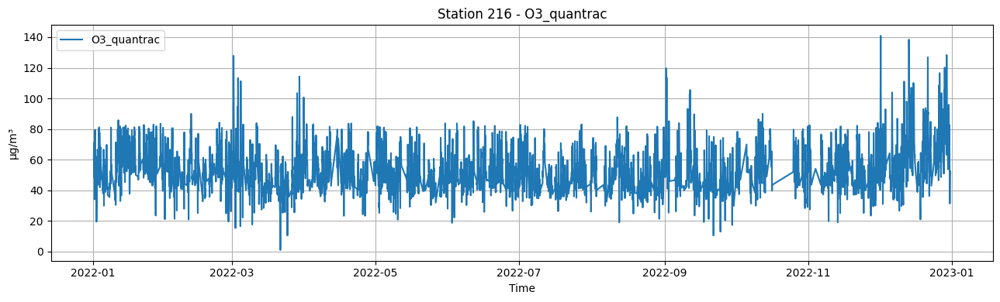

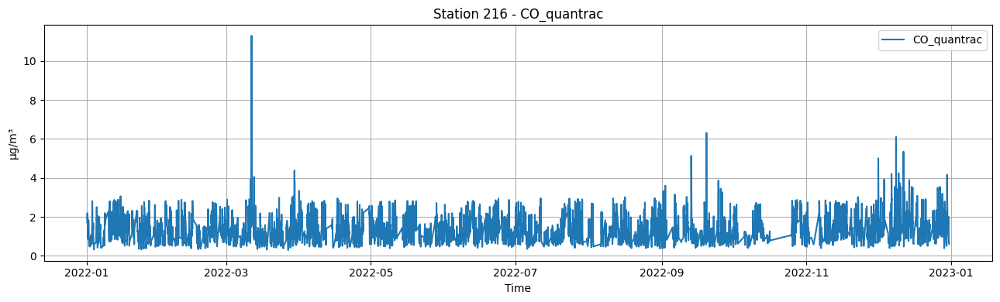

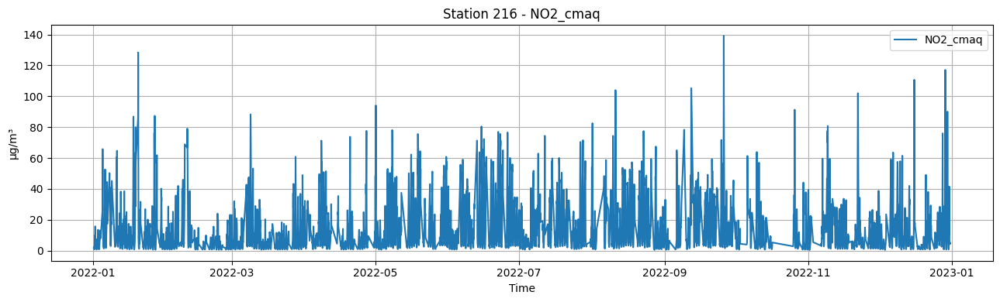

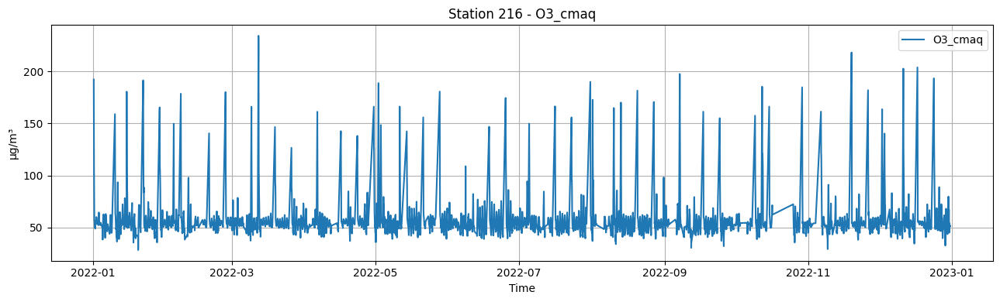

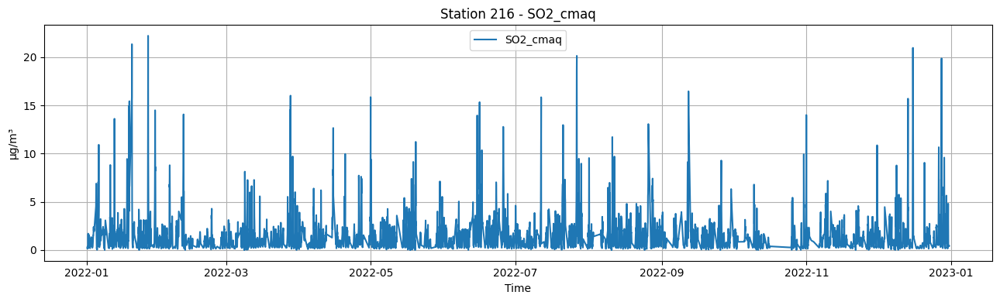

In [9]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [10]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Visualization after converting unit

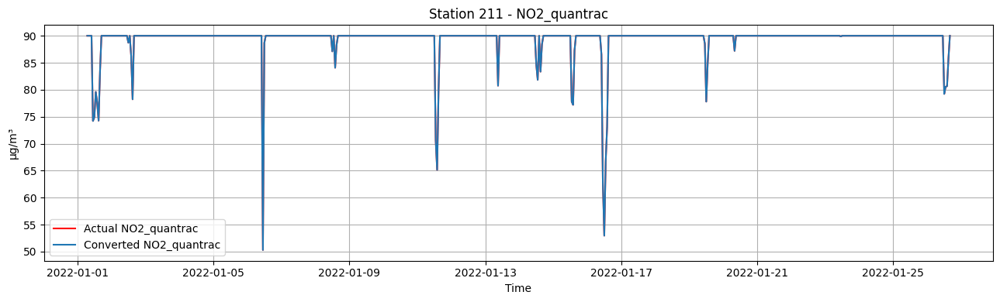

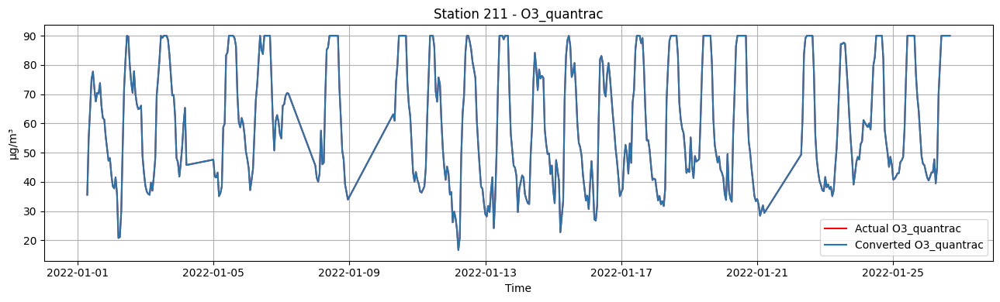

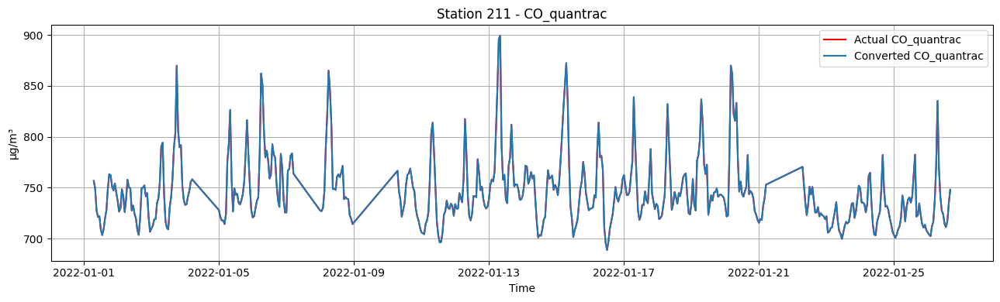

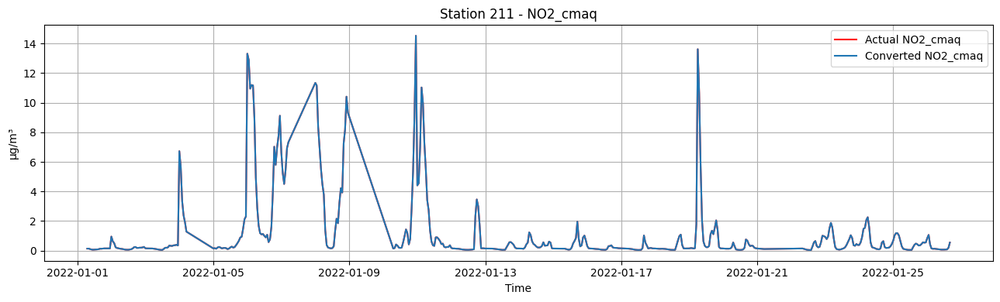

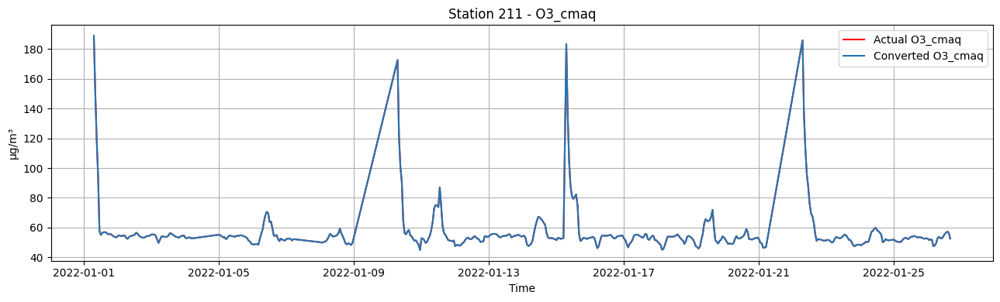

...

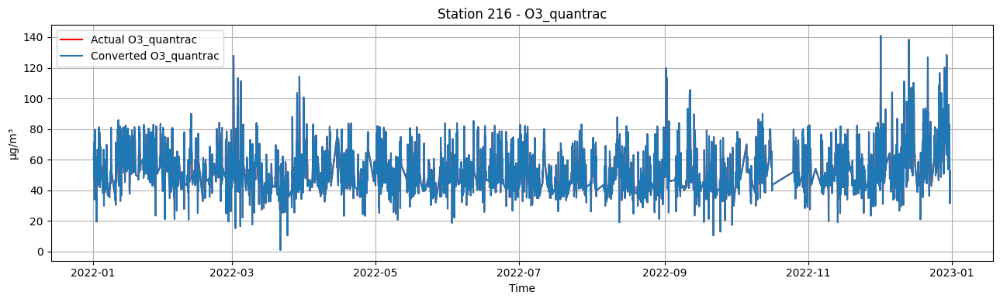

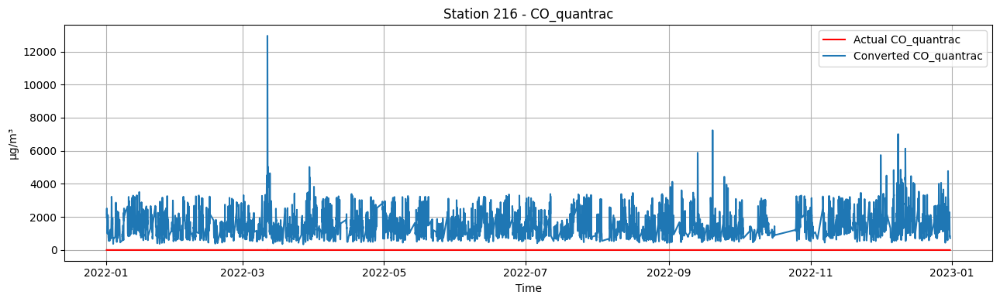

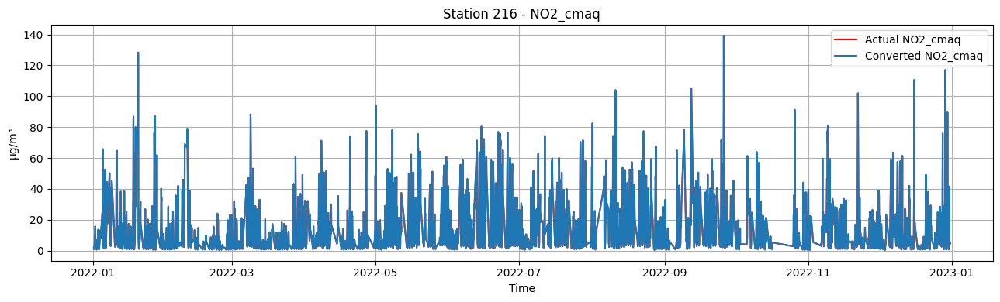

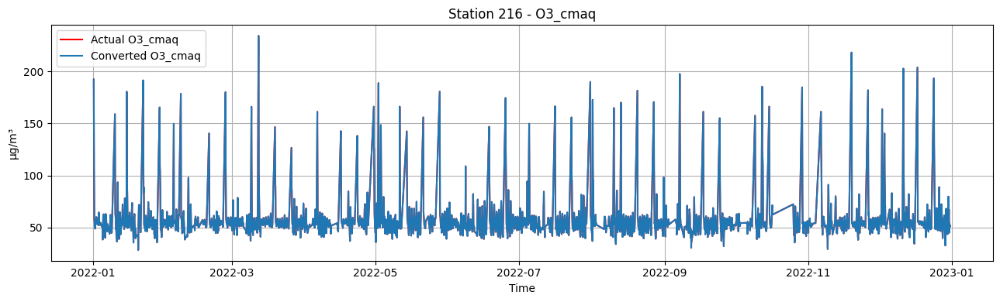

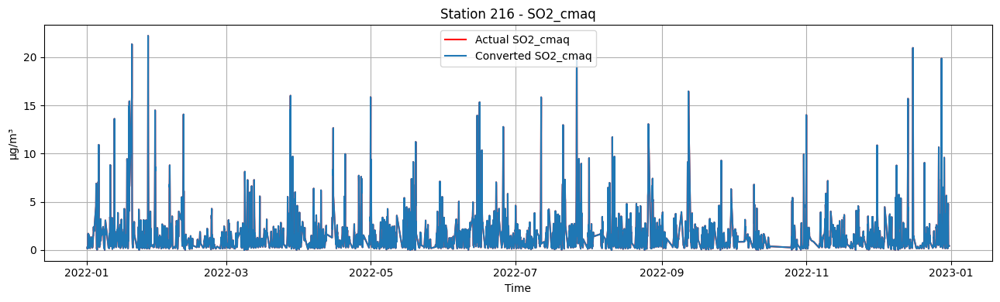

In [11]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [12]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

# CMAQ

# 211 NO2 cmaq
# 211 O3 cmaq
test211 = test[test["station_id"] == 211]
test = test.drop(index=test211[test211["NO2_cmaq"] > 10].index, errors="ignore")
test = test.drop(index=test211[test211["O3_cmaq"] > 100].index, errors="ignore")
test = test.drop(index=test211[test211["SO2_cmaq"] > 1.5].index, errors="ignore")

# 212 O3 cmaq
# 212 SO2 cmaq
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["O3_cmaq"] > 100].index, errors="ignore")
test = test.drop(index=test212[test212["SO2_cmaq"] > 25].index, errors="ignore")

# 213 NO2 cmaq
# 213 O3 cmaq
# 213 SO2 cmaq
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["NO2_cmaq"] > 80].index, errors="ignore")
test = test.drop(index=test213[test213["O3_cmaq"] > 140].index, errors="ignore")
test = test.drop(index=test213[test213["SO2_cmaq"] > 20].index, errors="ignore")

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 8233 records
After: 8180 records
Removed 53 records


## Visualization after removing outliers

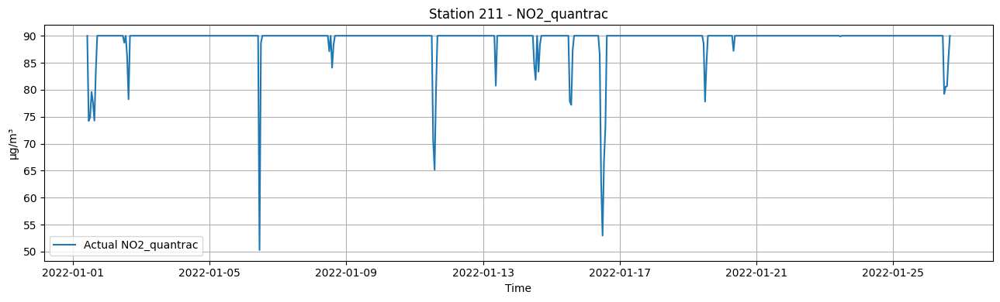

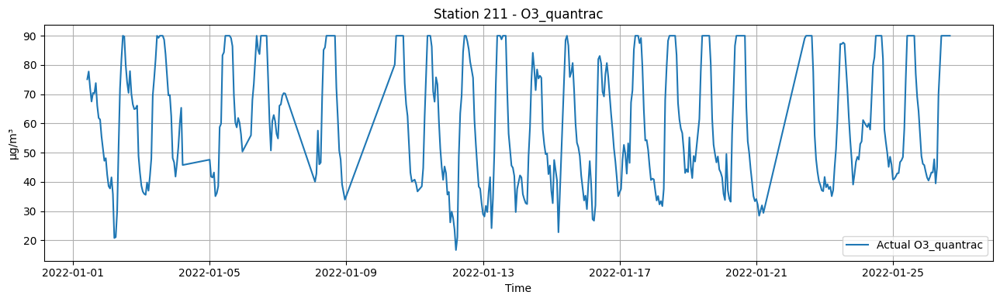

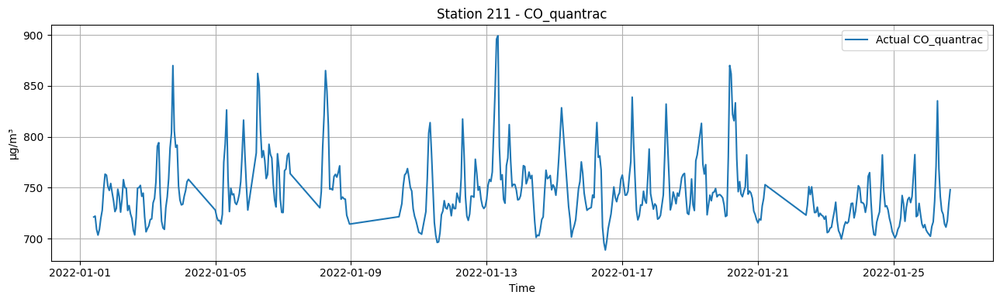

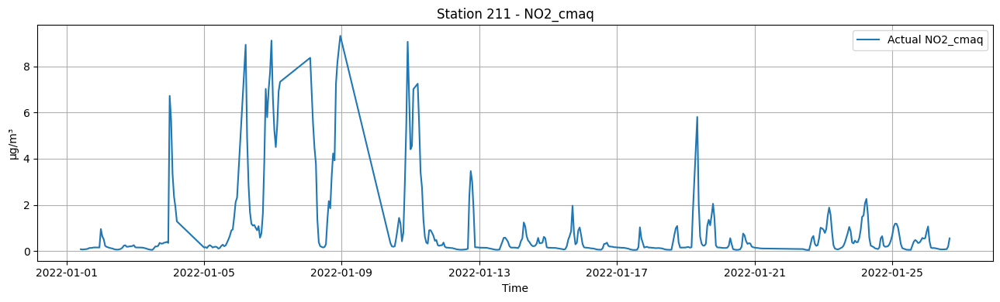

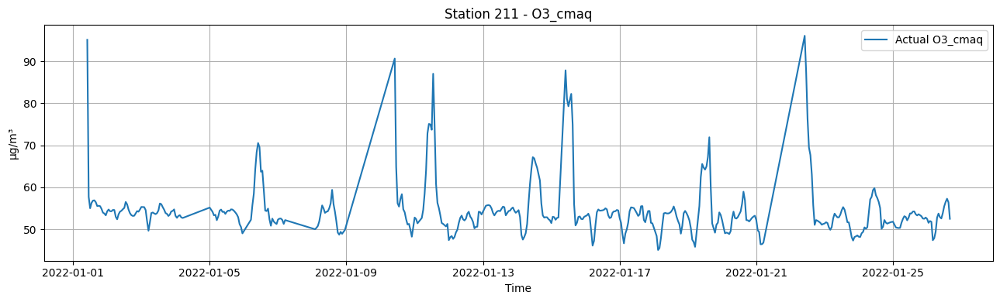

...

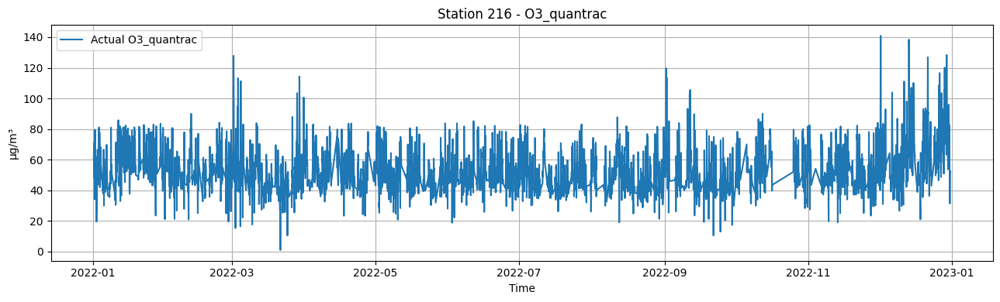

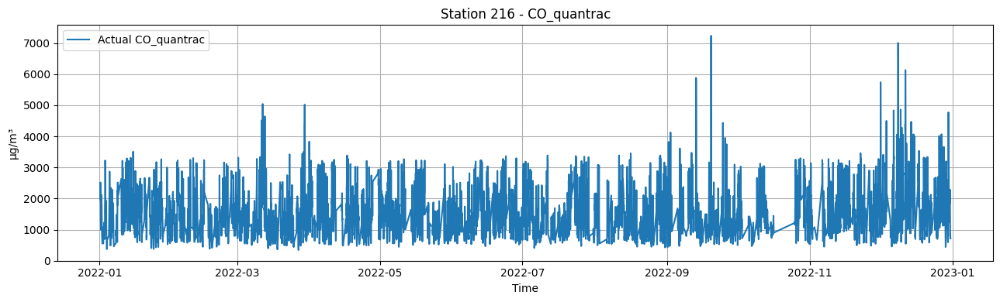

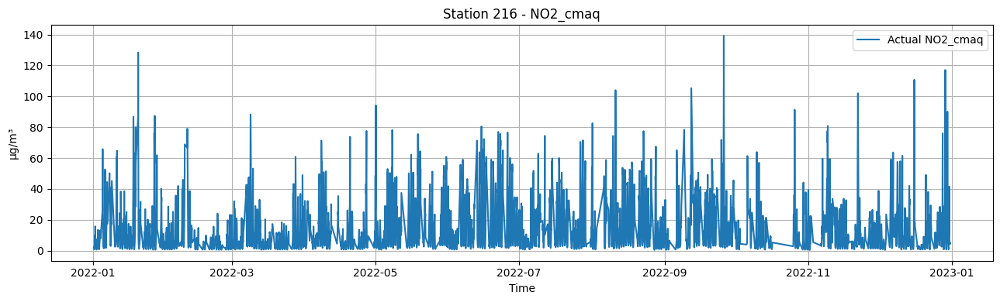

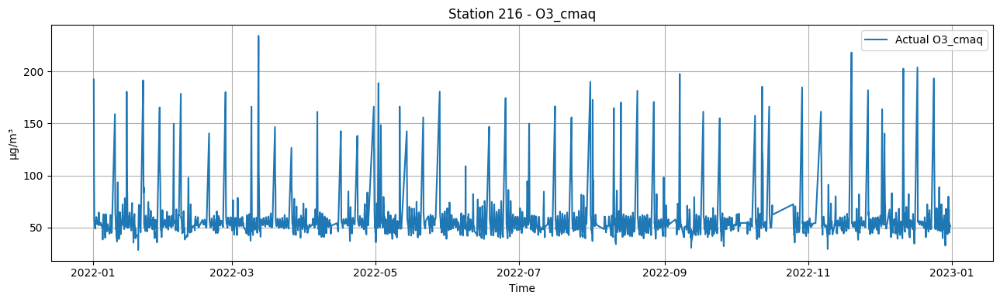

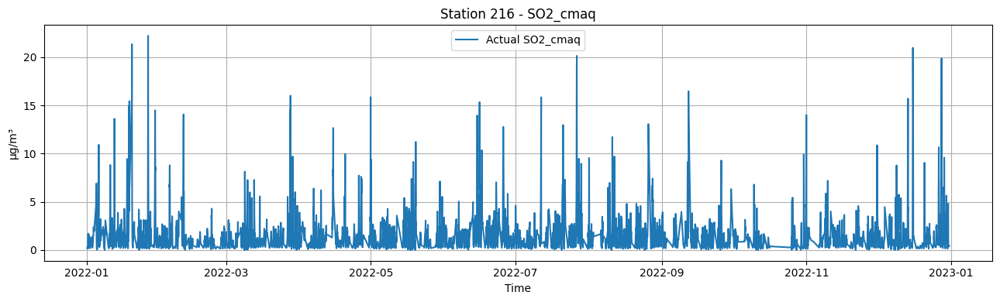

In [13]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

In [14]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(df_converted, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(df_converted, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(8180, 19)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'NO2_quantrac_roll3_mean',
       'NO2_quantrac_roll3_std', 'NO2_quantrac_roll6_mean',
       'NO2_quantrac_roll6_std', 'NO2_quantrac_roll12_mean',
       'NO2_quantrac_roll12_std', 'NO2_quantrac_roll24_mean',
       'NO2_quantrac_roll24_std'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211,90.000000,NaN,90.000000,NaN,90.000000,NaN,90.000000,NaN
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,211,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,211,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,211,76.231091,2.933756,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216,162.467849,16.160517,167.076458,11.438594,151.443282,20.588002,157.199778,20.786118
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216,136.126298,40.487158,154.120158,32.318802,149.118635,25.435481,154.467975,24.639817
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216,118.448157,25.741473,145.145079,33.472296,146.514295,26.848976,153.499776,25.572650
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216,113.855242,19.401097,138.161545,31.048054,145.117588,27.265733,152.945279,25.944042


## Build supervised from time-series

In [15]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=72, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (7890, 18) (7890, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac_roll24_mean', 'NO2_quantrac_roll24_std'],
      dtype='object')
Index(['date', 'station_id', 'NO2_quantrac_t_plus_72h'], dtype='object')


,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2022-01-01 12:00:00,211,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091
1,2022-01-01 13:00:00,211,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288
2,2022-01-01 14:00:00,211,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,76.231091,2.933756,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284
3,2022-01-01 15:00:00,211,8.450000,70.273672,719.821700,32.001667,49.851667,0.096796,56.897938,0.066810,77.369069,2.362834,79.262911,6.379061,79.262911,6.379061,79.262911,6.379061
4,2022-01-01 16:00:00,211,9.866667,73.807903,727.805500,31.581667,52.300000,0.130506,56.437004,0.034322,77.161379,2.693857,78.430289,6.059166,78.430289,6.059166,78.430289,6.059166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7885,2022-12-28 01:00:00,216,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,168.263920,11.260467,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585
7886,2022-12-28 02:00:00,216,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,161.955200,3.029911,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841
7887,2022-12-28 03:00:00,216,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,168.090712,13.369010,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842
7888,2022-12-28 04:00:00,216,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,182.533012,20.234834,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660


,date,station_id,NO2_quantrac_t_plus_72h
0,2022-01-01 12:00:00,211,90.000000
1,2022-01-01 13:00:00,211,90.000000
2,2022-01-01 14:00:00,211,90.000000
3,2022-01-01 15:00:00,211,90.000000
4,2022-01-01 16:00:00,211,90.000000
...,...,...,...
7885,2022-12-28 01:00:00,216,92.346548
7886,2022-12-28 02:00:00,216,119.184217
7887,2022-12-28 03:00:00,216,130.034960
7888,2022-12-28 04:00:00,216,121.654720


## Split train/validation/test for each station

In [16]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
355,19.966667,44.278621,741.939500,25.538333,82.376667,0.155741,54.025587,0.166370,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482
356,23.800000,43.220131,740.048600,24.866667,85.723333,0.151974,53.418367,0.165322,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482
357,24.216667,41.524122,733.153500,24.635000,86.016667,0.147643,52.144722,0.170038,90.000000,0.000000,90.000000,0.000000,88.553533,3.698147,89.216043,2.661482
358,22.250000,35.910420,721.674400,24.271667,84.961667,0.139168,50.516562,0.178160,90.000000,0.000000,90.000000,0.000000,89.570823,1.486712,89.216043,2.661482
359,23.150000,33.811563,722.629400,23.910000,86.255000,0.131259,49.054698,0.181828,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,89.216043,2.661482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7885,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,168.263920,11.260467,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585
7886,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,161.955200,3.029911,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841
7887,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,168.090712,13.369010,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842
7888,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,182.533012,20.234834,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660


# LightGBM model

## Add time and lags features

In [17]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [18]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (8080, 57)
y.shape = (8080, 3)

Number of features: 57

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cmaq_lag3
SO2_cmaq_lag6
SO2_cmaq_lag12
SO2_cmaq_lag24
NO2_quantrac_roll3_mean
NO2_quantrac_roll3_std
NO2_quantrac_r

,date,target
0,2022-01-24,90.000000
1,2022-01-25,90.000000
2,2022-01-26,87.889799


,date,target
0,2022-01-24,89.746458
1,2022-01-25,89.905946
2,2022-01-26,88.661505


sid = 212, grp =                    date  station_id      y_true     y_pred
870 2022-01-23 16:00:00         212   80.330033  88.683468
871 2022-01-23 17:00:00         212   89.300900  92.732153
872 2022-01-23 18:00:00         212  102.819933  88.480539
873 2022-01-23 19:00:00         212  106.019333  91.383665
874 2022-01-23 20:00:00         212   92.029800  91.706322
..                  ...         ...         ...        ...
937 2022-01-26 11:00:00         212   39.490633  25.872348
938 2022-01-26 12:00:00         212   32.088100  27.291555
939 2022-01-26 13:00:00         212   55.173967  33.434386
940 2022-01-26 14:00:00         212  112.763167  47.617653
941 2022-01-26 15:00:00         212   66.426152  71.859545

[72 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 8
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, n

,date,target
0,2022-01-24,77.564899
1,2022-01-25,62.508781
2,2022-01-26,67.953188


,date,target
0,2022-01-24,76.052390
1,2022-01-25,79.912143
2,2022-01-26,58.986022


sid = 213, grp =                     date  station_id     y_true     y_pred
1352 2022-01-23 15:00:00         213  61.070900  70.907835
1353 2022-01-23 16:00:00         213  66.967833  78.937202
1354 2022-01-23 17:00:00         213  76.879700  86.945388
1355 2022-01-23 18:00:00         213  85.850567  82.097972
1356 2022-01-23 19:00:00         213  71.955133  82.612391
...                  ...         ...        ...        ...
1420 2022-01-26 11:00:00         213  12.515300  12.685819
1421 2022-01-26 12:00:00         213   8.249433  15.105804
1422 2022-01-26 13:00:00         213  10.100067  25.073572
1423 2022-01-26 14:00:00         213  52.727367  42.363367
1424 2022-01-26 15:00:00         213  81.060429  80.897075

[73 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 9
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, n

,date,target
0,2022-01-24,62.723704
1,2022-01-25,67.646904
2,2022-01-26,46.361845


,date,target
0,2022-01-24,61.256676
1,2022-01-25,62.772839
2,2022-01-26,48.204603


sid = 216, grp =                     date  station_id      y_true      y_pred
7081 2022-11-12 18:00:00         216  167.290933  165.939998
7082 2022-11-12 19:00:00         216  164.340587  159.635857
7083 2022-11-12 20:00:00         216  157.686613  156.999177
7084 2022-11-12 21:00:00         216  158.690987  155.595540
7085 2022-11-12 22:00:00         216  157.969093  151.672866
...                  ...         ...         ...         ...
8075 2022-12-31 00:00:00         216   92.346548  145.921951
8076 2022-12-31 01:00:00         216  119.184217  125.105953
8077 2022-12-31 02:00:00         216  130.034960  133.318047
8078 2022-12-31 03:00:00         216  121.654720  134.489445
8079 2022-12-31 04:00:00         216  121.497787  138.305621

[999 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.da

,date,target
0,2022-11-13,130.103920
1,2022-11-14,136.955349
2,2022-11-15,136.683809
3,2022-11-16,142.816852
4,2022-11-17,152.204247
5,2022-11-19,136.834789
6,2022-11-20,129.321464
7,2022-11-21,141.523072
8,2022-11-22,154.247124
9,2022-11-23,142.379967


,date,target
0,2022-11-13,132.761827
1,2022-11-14,130.120147
2,2022-11-15,133.396791
3,2022-11-16,137.790753
4,2022-11-17,137.850764
5,2022-11-19,139.397277
6,2022-11-20,130.487015
7,2022-11-21,137.765522
8,2022-11-22,145.145872
9,2022-11-23,142.067920


Overall test metrics: {'rmse': 17.66, 'mae': 12.28, 'mape': 14.36, 'mnbe': -5.04, 'r': 0.9, 'n_samples': 1215}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (7988, 57)
y.shape = (7988, 3)

Number of features: 57

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cma

,date,target
0,2022-01-23,90.000000
1,2022-01-24,90.000000
2,2022-01-25,88.013928


,date,target
0,2022-01-23,91.062441
1,2022-01-24,91.054440
2,2022-01-25,90.902541


sid = 212, grp =                    date  station_id      y_true     y_pred
828 2022-01-22 21:00:00         212   92.029800  86.126930
829 2022-01-22 22:00:00         212   95.072367  88.635766
830 2022-01-22 23:00:00         212   93.660867  94.375029
831 2022-01-23 00:00:00         212   88.014867  97.024654
832 2022-01-23 01:00:00         212   89.363633  92.610812
..                  ...         ...         ...        ...
891 2022-01-25 12:00:00         212   39.490633  63.793434
892 2022-01-25 13:00:00         212   32.088100  65.531076
893 2022-01-25 14:00:00         212   55.173967  67.443406
894 2022-01-25 15:00:00         212  112.763167  69.619815
895 2022-01-25 16:00:00         212   66.426152  70.443371

[68 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 3
Current date = 2022-01-23, number of records = 24
Current date = 2022-01-24, n

,date,target
0,2022-01-23,77.666841
1,2022-01-24,63.868616
2,2022-01-25,67.069601


,date,target
0,2022-01-23,82.972683
1,2022-01-24,80.256596
2,2022-01-25,78.088476


sid = 213, grp =                     date  station_id     y_true     y_pred
1287 2022-01-22 20:00:00         213  71.955133  75.425575
1288 2022-01-22 21:00:00         213  73.931233  82.718049
1289 2022-01-22 22:00:00         213  73.021600  85.085237
1290 2022-01-22 23:00:00         213  84.219500  79.079597
1291 2022-01-23 00:00:00         213  73.335267  83.937235
...                  ...         ...        ...        ...
1351 2022-01-25 12:00:00         213  12.515300  49.821900
1352 2022-01-25 13:00:00         213   8.249433  56.029654
1353 2022-01-25 14:00:00         213  10.100067  55.761152
1354 2022-01-25 15:00:00         213  52.727367  61.332815
1355 2022-01-25 16:00:00         213  81.060429  58.961422

[69 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 4
Current date = 2022-01-23, number of records = 24
Current date = 2022-01-24, n

,date,target
0,2022-01-23,62.322472
1,2022-01-24,68.142236
2,2022-01-25,47.815670


,date,target
0,2022-01-23,66.546975
1,2022-01-24,68.394337
2,2022-01-25,63.111917


sid = 216, grp =                     date  station_id      y_true      y_pred
6993 2022-11-11 05:00:00         216  157.969093  126.585540
6994 2022-11-12 00:00:00         216  145.069173  131.414842
6995 2022-11-12 01:00:00         216  181.462309  129.298846
6996 2022-11-12 02:00:00         216  164.026720  129.832569
6997 2022-11-12 03:00:00         216  149.871333  128.454854
...                  ...         ...         ...         ...
7983 2022-12-30 01:00:00         216   92.346548  110.427823
7984 2022-12-30 02:00:00         216  119.184217  108.954146
7985 2022-12-30 03:00:00         216  130.034960  109.806758
7986 2022-12-30 04:00:00         216  121.654720  107.241512
7987 2022-12-30 05:00:00         216  121.497787  114.893614

[995 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.da

,date,target
0,2022-11-12,130.701575
1,2022-11-13,136.303123
2,2022-11-14,136.742304
3,2022-11-15,142.213967
4,2022-11-16,150.984090
5,2022-11-17,143.625446
6,2022-11-19,127.608955
7,2022-11-20,141.213129
8,2022-11-21,153.310755
9,2022-11-22,142.951466


,date,target
0,2022-11-12,123.069884
1,2022-11-13,126.072580
2,2022-11-14,127.348699
3,2022-11-15,126.757538
4,2022-11-16,128.023640
5,2022-11-17,126.009410
6,2022-11-19,125.429647
7,2022-11-20,129.363856
8,2022-11-21,129.208205
9,2022-11-22,131.949331


Overall test metrics: {'rmse': 30.47, 'mae': 23.01, 'mape': 24.56, 'mnbe': -3.65, 'r': 0.73, 'n_samples': 1199}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (7892, 57)
y.shape = (7892, 3)

Number of features: 57

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cm

,date,target
0,2022-01-22,90.000000
1,2022-01-23,90.000000
2,2022-01-24,88.013928


,date,target
0,2022-01-22,92.833151
1,2022-01-23,93.013392
2,2022-01-24,92.713916


sid = 212, grp =                    date  station_id      y_true     y_pred
783 2022-01-20 19:00:00         212   88.014867  89.566059
784 2022-01-20 20:00:00         212   89.363633  93.965433
785 2022-01-20 21:00:00         212   86.831586  96.171581
786 2022-01-20 22:00:00         212   88.924500  96.286770
787 2022-01-20 23:00:00         212   87.105233  94.874975
..                  ...         ...         ...        ...
843 2022-01-24 12:00:00         212   39.490633  69.994522
844 2022-01-24 13:00:00         212   32.088100  70.610780
845 2022-01-24 14:00:00         212   55.173967  73.408191
846 2022-01-24 15:00:00         212  112.763167  73.543194
847 2022-01-24 16:00:00         212   66.426152  84.904937

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 5
Current date = 2022-01-21, number of records = 6
C

,date,target
0,2022-01-22,74.481356
1,2022-01-23,63.868616
2,2022-01-24,67.069601


,date,target
0,2022-01-22,78.008061
1,2022-01-23,87.245060
2,2022-01-24,79.103057


sid = 213, grp =                     date  station_id     y_true     y_pred
1218 2022-01-20 20:00:00         213  84.219500  83.933613
1219 2022-01-20 21:00:00         213  73.335267  79.877353
1220 2022-01-20 22:00:00         213  68.595655  85.711925
1221 2022-01-20 23:00:00         213  75.499567  83.643060
1222 2022-01-21 00:00:00         213  55.581733  81.113450
...                  ...         ...        ...        ...
1279 2022-01-24 12:00:00         213  12.515300  63.672485
1280 2022-01-24 13:00:00         213   8.249433  65.449013
1281 2022-01-24 14:00:00         213  10.100067  71.060366
1282 2022-01-24 15:00:00         213  52.727367  74.481648
1283 2022-01-24 16:00:00         213  81.060429  82.120567

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 4
Current date = 2022-01-21, number of records = 6
C

,date,target
0,2022-01-22,58.665569
1,2022-01-23,68.142236
2,2022-01-24,47.815670


,date,target
0,2022-01-22,60.056838
1,2022-01-23,71.439805
2,2022-01-24,64.211496


sid = 216, grp =                     date  station_id      y_true      y_pred
6900 2022-11-10 08:00:00         216  164.026720  132.062504
6901 2022-11-10 09:00:00         216  149.871333  128.652239
6902 2022-11-10 10:00:00         216  144.472827  121.826735
6903 2022-11-10 11:00:00         216  146.575733  119.723694
6904 2022-11-10 12:00:00         216  143.845093  107.578014
...                  ...         ...         ...         ...
7887 2022-12-29 01:00:00         216   92.346548  116.920239
7888 2022-12-29 02:00:00         216  119.184217  119.620567
7889 2022-12-29 03:00:00         216  130.034960  117.813420
7890 2022-12-29 04:00:00         216  121.654720  117.288536
7891 2022-12-29 05:00:00         216  121.497787  117.374270

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.da

,date,target
0,2022-11-10,127.618621
1,2022-11-12,136.303123
2,2022-11-13,136.742304
3,2022-11-14,142.213967
4,2022-11-15,150.984090
5,2022-11-16,143.625446
6,2022-11-17,129.321464
7,2022-11-19,147.122231
8,2022-11-20,153.310755
9,2022-11-21,142.951466


,date,target
0,2022-11-10,123.255411
1,2022-11-12,122.338436
2,2022-11-13,124.093403
3,2022-11-14,122.772706
4,2022-11-15,127.446615
5,2022-11-16,123.351420
6,2022-11-17,125.834947
7,2022-11-19,123.012186
8,2022-11-20,120.555109
9,2022-11-21,123.523056


Overall test metrics: {'rmse': 32.36, 'mae': 25.43, 'mape': 27.6, 'mnbe': -5.04, 'r': 0.69, 'n_samples': 1186}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (7796, 57)
y.shape = (7796, 3)

Number of features: 57

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cma

,date,target
0,2022-01-20,90.000000
1,2022-01-22,90.000000
2,2022-01-23,88.013928


,date,target
0,2022-01-20,94.782032
1,2022-01-22,94.707080
2,2022-01-23,94.804122


sid = 212, grp =                    date  station_id      y_true      y_pred
739 2022-01-19 19:00:00         212   87.105233   94.703683
740 2022-01-19 20:00:00         212   88.987233   98.662990
741 2022-01-19 21:00:00         212   91.277000   97.319408
742 2022-01-19 22:00:00         212   85.976033   99.195105
743 2022-01-20 03:00:00         212   60.569033  100.907804
..                  ...         ...         ...         ...
795 2022-01-23 12:00:00         212   39.490633   70.733419
796 2022-01-23 13:00:00         212   32.088100   76.180511
797 2022-01-23 14:00:00         212   55.173967   85.545543
798 2022-01-23 15:00:00         212  112.763167   91.154601
799 2022-01-23 16:00:00         212   66.426152   93.783353

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 4
Current date = 2022-01-20, number of r

,date,target
0,2022-01-20,74.611050
1,2022-01-22,52.932214
2,2022-01-23,67.069601


,date,target
0,2022-01-20,83.303826
1,2022-01-22,81.177844
2,2022-01-23,87.280314


sid = 213, grp =                     date  station_id     y_true     y_pred
1150 2022-01-19 22:00:00         213  55.581733  81.755161
1151 2022-01-19 23:00:00         213  64.583967  79.869382
1152 2022-01-20 00:00:00         213  78.604867  81.807697
1153 2022-01-20 01:00:00         213  62.262833  80.038197
1154 2022-01-20 02:00:00         213  52.790100  70.846304
...                  ...         ...        ...        ...
1207 2022-01-23 12:00:00         213  12.515300  65.071696
1208 2022-01-23 13:00:00         213   8.249433  74.678190
1209 2022-01-23 14:00:00         213  10.100067  81.982458
1210 2022-01-23 15:00:00         213  52.727367  78.273938
1211 2022-01-23 16:00:00         213  81.060429  86.474345

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 2
Current date = 2022-01-20, number of records = 22


,date,target
0,2022-01-20,63.616336
1,2022-01-22,67.860738
2,2022-01-23,47.815670


,date,target
0,2022-01-20,67.811113
1,2022-01-22,66.713577
2,2022-01-23,73.206055


sid = 216, grp =                     date  station_id      y_true      y_pred
6808 2022-11-09 12:00:00         216  143.845093  126.778301
6809 2022-11-09 13:00:00         216  150.499067  116.065735
6810 2022-11-09 14:00:00         216  137.002800  111.952138
6811 2022-11-09 15:00:00         216  110.229973  106.848980
6812 2022-11-09 16:00:00         216   87.882667  119.755373
...                  ...         ...         ...         ...
7791 2022-12-28 01:00:00         216   92.346548  122.908465
7792 2022-12-28 02:00:00         216  119.184217  118.251152
7793 2022-12-28 03:00:00         216  130.034960  120.831188
7794 2022-12-28 04:00:00         216  121.654720  121.928805
7795 2022-12-28 05:00:00         216  121.497787  120.925979

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.dat

,date,target
0,2022-11-09,119.745944
1,2022-11-10,127.617733
2,2022-11-12,136.742304
3,2022-11-13,142.213967
4,2022-11-14,150.984090
5,2022-11-15,143.625446
6,2022-11-16,129.321464
7,2022-11-17,141.523072
8,2022-11-19,162.446018
9,2022-11-20,142.951466


,date,target
0,2022-11-09,124.337697
1,2022-11-10,120.990099
2,2022-11-12,126.945693
3,2022-11-13,127.660694
4,2022-11-14,126.537610
5,2022-11-15,125.574613
6,2022-11-16,125.007315
7,2022-11-17,127.012782
8,2022-11-19,125.422542
9,2022-11-20,121.748406


Overall test metrics: {'rmse': 33.88, 'mae': 27.17, 'mape': 30.22, 'mnbe': -6.79, 'r': 0.63, 'n_samples': 1171}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,2.13,1.31,1.49,-0.09,0.50,71,-0.16
1,211,24,2.79,1.70,1.96,-1.91,0.05,67,-1.88
2,211,48,3.99,3.40,3.87,-3.87,0.32,63,-3.95
3,211,72,5.78,5.33,6.03,-6.03,-0.36,60,-6.09
4,212,1,16.43,11.32,18.24,-7.27,0.63,72,-4.23
5,212,24,18.45,12.78,23.25,-20.71,0.60,68,-16.31
6,212,48,22.73,17.77,32.10,-28.92,0.44,65,-19.76
7,212,72,26.77,22.32,39.52,-34.52,0.27,61,-31.72
8,213,1,14.59,11.35,29.66,-10.01,0.80,73,1.86
9,213,24,17.85,13.32,54.97,-44.97,0.71,69,-13.05


station_id = 211
hour = 1


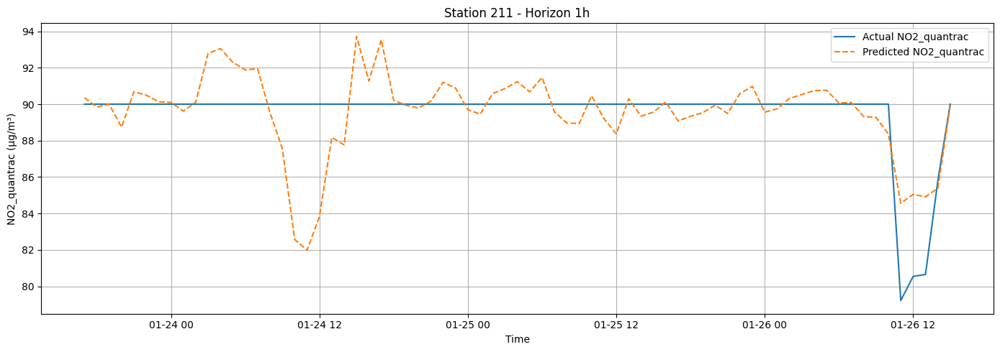

hour = 24


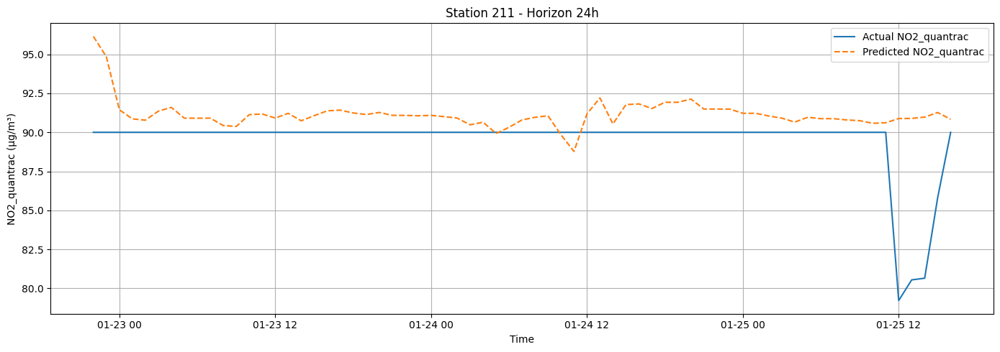

hour = 48


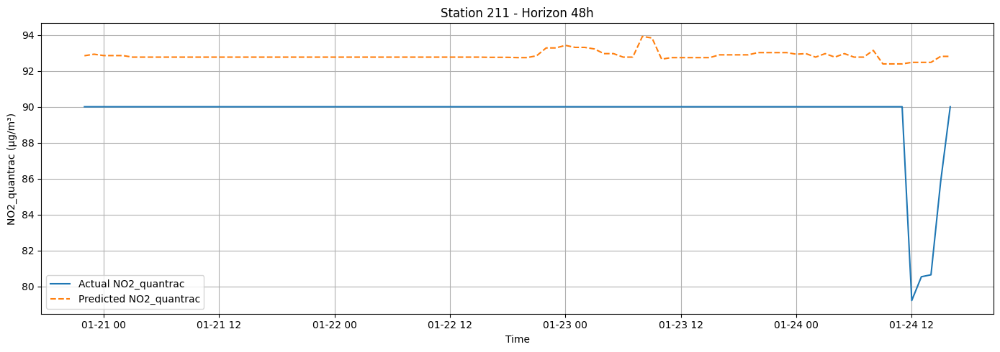

hour = 72


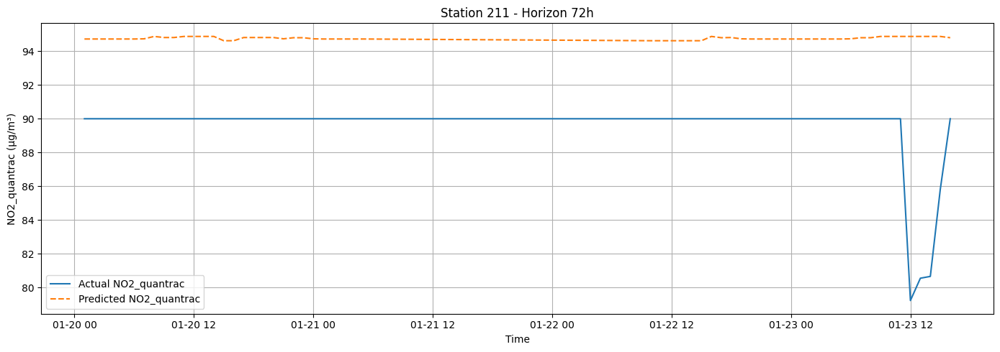

station_id = 212
hour = 1


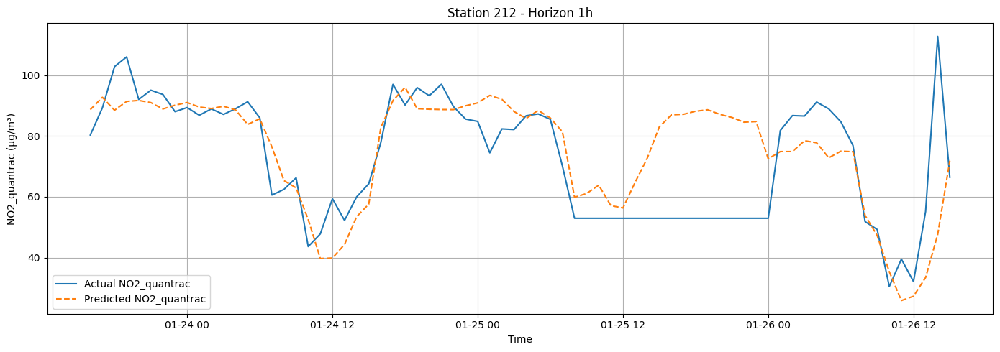

hour = 24


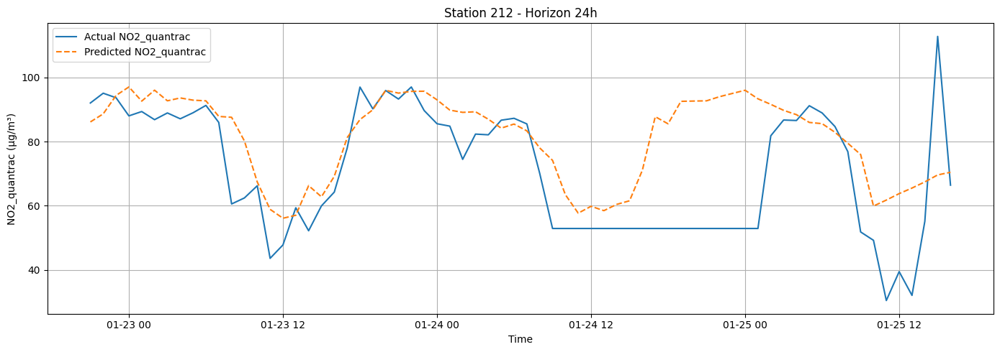

hour = 48


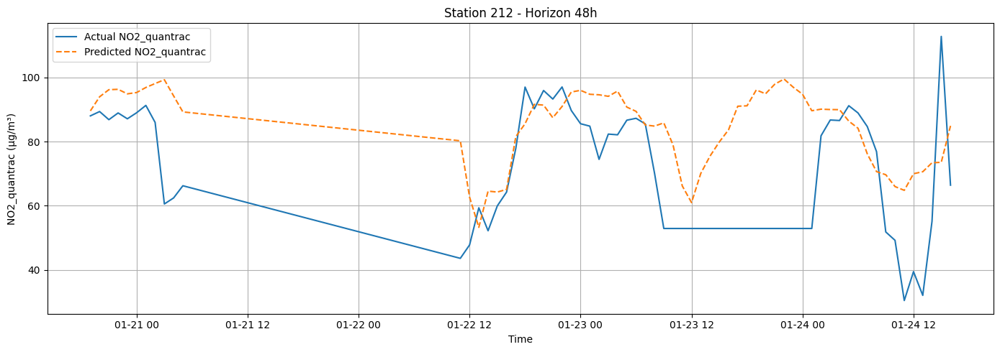

hour = 72


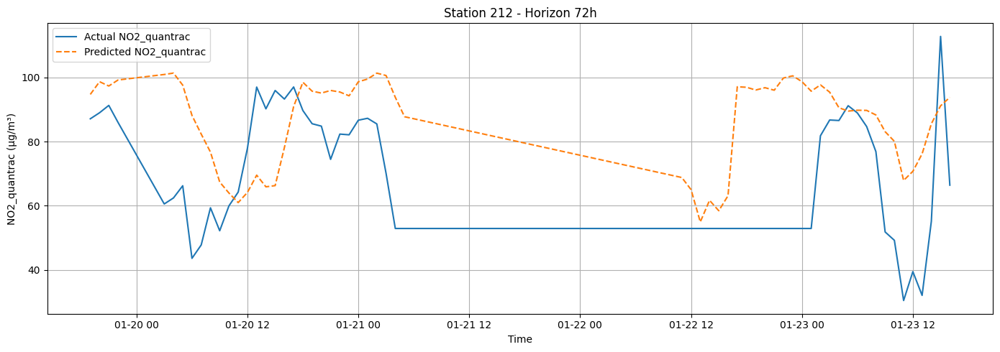

station_id = 213
hour = 1


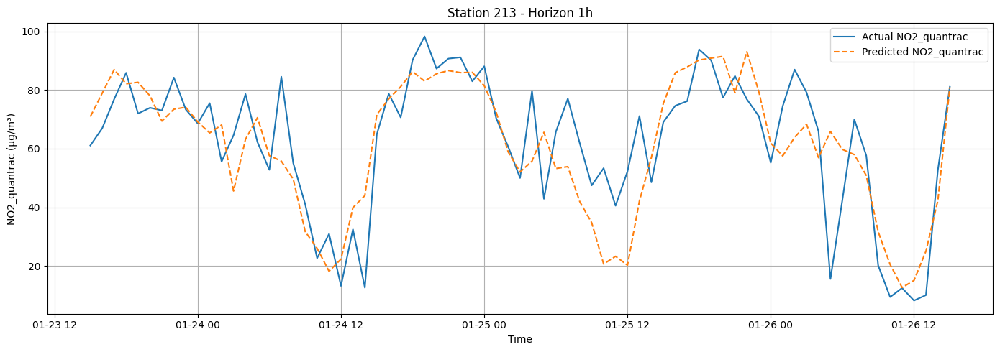

hour = 24


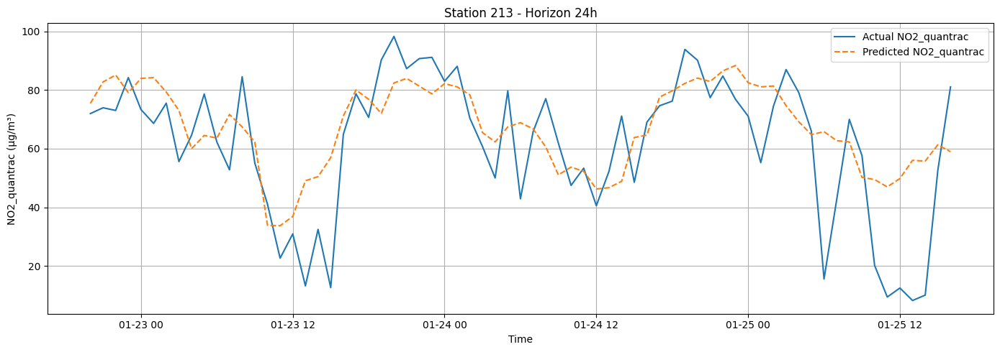

hour = 48


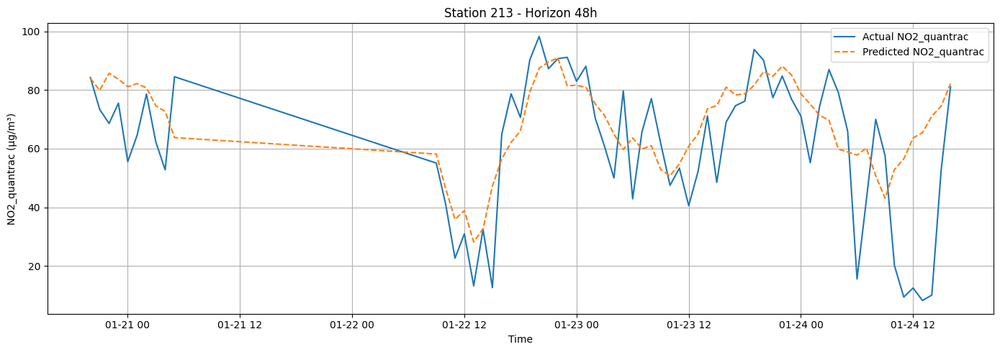

hour = 72


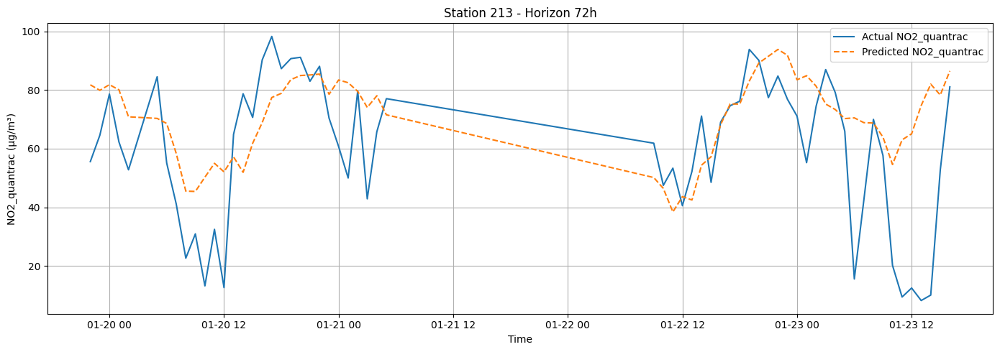

station_id = 216
hour = 1


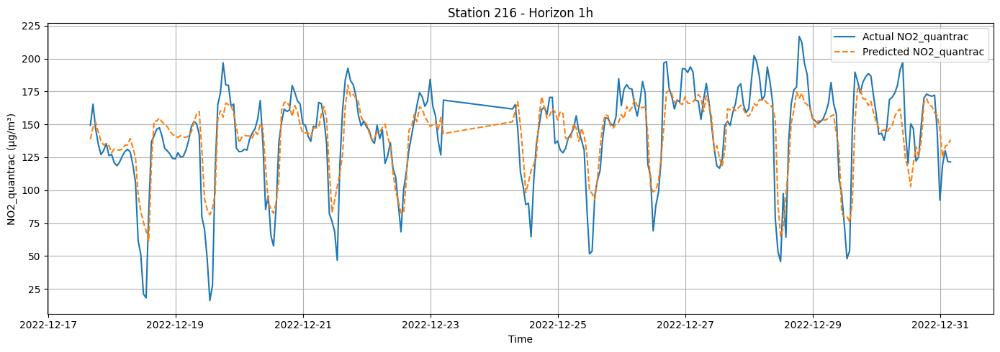

hour = 24


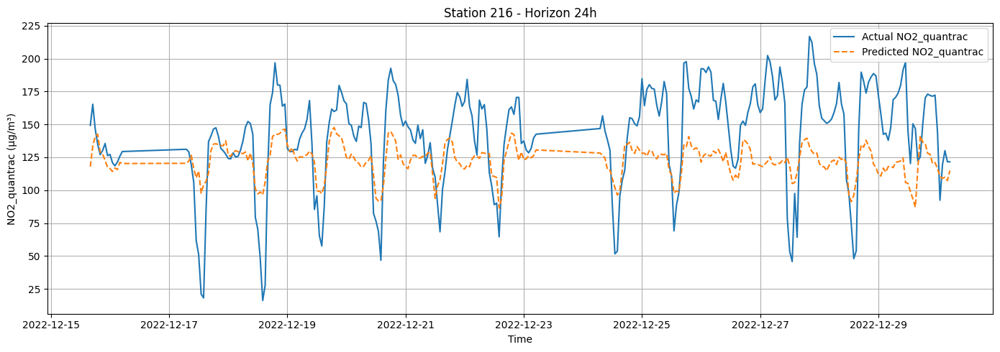

hour = 48


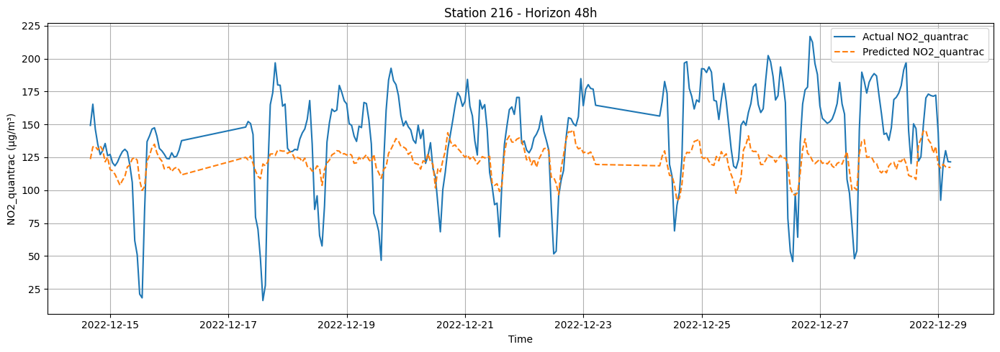

hour = 72


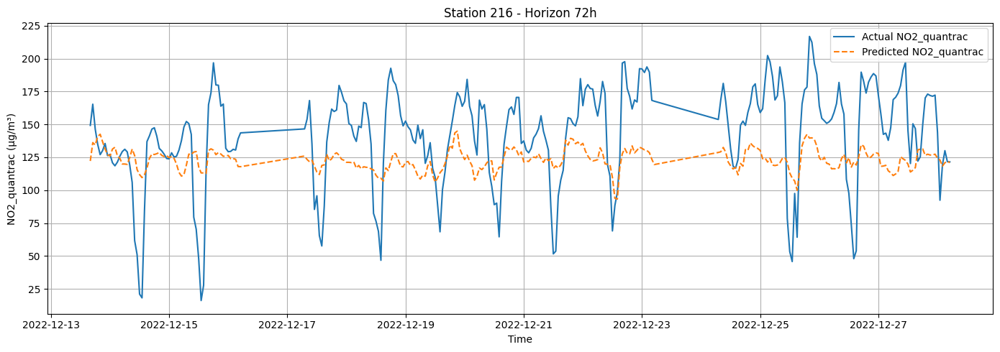

In [19]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [20]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (8080, 57)
y.shape = (8080, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cmaq_lag3
SO2_cmaq_lag6
SO2_cmaq_lag12
SO2_cmaq_lag24
O3_quantrac_roll3_mean
O3_quantrac_roll3_std
O3_quantrac_roll

,date,target
0,2022-01-24,65.401386
1,2022-01-25,61.589075
2,2022-01-26,67.551698


,date,target
0,2022-01-24,60.529072
1,2022-01-25,59.714400
2,2022-01-26,63.383134


sid = 212, grp =                    date  station_id      y_true      y_pred
870 2022-01-23 16:00:00         212  146.832400  122.769063
871 2022-01-23 17:00:00         212  149.449733  133.009710
872 2022-01-23 18:00:00         212  159.722767  126.744074
873 2022-01-23 19:00:00         212  146.145350  134.139012
874 2022-01-23 20:00:00         212  140.845250  127.144558
..                  ...         ...         ...         ...
937 2022-01-26 11:00:00         212  157.694333  142.194292
938 2022-01-26 12:00:00         212  153.539317  139.175096
939 2022-01-26 13:00:00         212   90.000000  143.020845
940 2022-01-26 14:00:00         212   90.000000  136.808680
941 2022-01-26 15:00:00         212   90.000000  114.985339

[72 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 8
Current date = 2022-01-24, number of records = 24
Current date = 2

,date,target
0,2022-01-24,117.172129
1,2022-01-25,91.615796
2,2022-01-26,101.975289


,date,target
0,2022-01-24,114.240428
1,2022-01-25,110.704219
2,2022-01-26,108.839114


sid = 213, grp =                     date  station_id      y_true      y_pred
1352 2022-01-23 15:00:00         213  125.141250  104.055496
1353 2022-01-23 16:00:00         213  113.494117  102.806237
1354 2022-01-23 17:00:00         213  109.633550  107.355991
1355 2022-01-23 18:00:00         213  104.398883  106.149907
1356 2022-01-23 19:00:00         213   77.603933   93.277609
...                  ...         ...         ...         ...
1420 2022-01-26 11:00:00         213   98.706183   92.773930
1421 2022-01-26 12:00:00         213   91.770250  100.173849
1422 2022-01-26 13:00:00         213   95.074633   97.410162
1423 2022-01-26 14:00:00         213   86.239958  100.237856
1424 2022-01-26 15:00:00         213   90.000000   98.507525

[73 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 9
Current date = 2022-01-24, number of records = 24
Curr

,date,target
0,2022-01-24,87.420441
1,2022-01-25,84.291718
2,2022-01-26,67.773196


,date,target
0,2022-01-24,87.011901
1,2022-01-25,78.056993
2,2022-01-26,73.163015


sid = 216, grp =                     date  station_id     y_true     y_pred
7081 2022-11-12 18:00:00         216  73.316667  68.773547
7082 2022-11-12 19:00:00         216  70.050000  66.820499
7083 2022-11-12 20:00:00         216  67.100000  63.969632
7084 2022-11-12 21:00:00         216  63.900000  59.025673
7085 2022-11-12 22:00:00         216  61.333333  56.242347
...                  ...         ...        ...        ...
8075 2022-12-31 00:00:00         216  31.425926  54.544820
8076 2022-12-31 01:00:00         216  43.220339  48.430219
8077 2022-12-31 02:00:00         216  48.866667  48.178489
8078 2022-12-31 03:00:00         216  50.633333  46.439453
8079 2022-12-31 04:00:00         216  52.333333  44.214802

[999 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.date(2022, 11, 19), dateti

,date,target
0,2022-11-13,45.796073
1,2022-11-14,49.874950
2,2022-11-15,52.181892
3,2022-11-16,56.899045
4,2022-11-17,57.691762
5,2022-11-19,49.926471
6,2022-11-20,41.273951
7,2022-11-21,53.738353
8,2022-11-22,51.566107
9,2022-11-23,47.537124


,date,target
0,2022-11-13,50.273543
1,2022-11-14,51.208169
2,2022-11-15,51.704368
3,2022-11-16,55.505935
4,2022-11-17,54.979364
5,2022-11-19,51.307132
6,2022-11-20,44.588978
7,2022-11-21,52.748327
8,2022-11-22,53.547961
9,2022-11-23,48.770399


Overall test metrics: {'rmse': 12.9, 'mae': 8.84, 'mape': 13.98, 'mnbe': -1.51, 'r': 0.83, 'n_samples': 1215}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (7988, 57)
y.shape = (7988, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cmaq

,date,target
0,2022-01-23,65.686438
1,2022-01-24,61.561274
2,2022-01-25,66.017513


,date,target
0,2022-01-23,54.725315
1,2022-01-24,62.443794
2,2022-01-25,63.189389


sid = 212, grp =                    date  station_id      y_true      y_pred
828 2022-01-22 21:00:00         212  140.845250  131.645145
829 2022-01-22 22:00:00         212  136.526650  117.078821
830 2022-01-22 23:00:00         212  124.127033  121.932668
831 2022-01-23 00:00:00         212  113.330533  115.761515
832 2022-01-23 01:00:00         212  108.194017  110.781795
..                  ...         ...         ...         ...
891 2022-01-25 12:00:00         212  157.694333  135.096741
892 2022-01-25 13:00:00         212  153.539317  129.621458
893 2022-01-25 14:00:00         212   90.000000  118.176200
894 2022-01-25 15:00:00         212   90.000000  116.369108
895 2022-01-25 16:00:00         212   90.000000  111.653432

[68 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 3
Current date = 2022-01-23, number of records = 24
Current date = 2

,date,target
0,2022-01-23,117.297543
1,2022-01-24,92.462487
2,2022-01-25,101.270861


,date,target
0,2022-01-23,112.142126
1,2022-01-24,115.418183
2,2022-01-25,111.928863


sid = 213, grp =                     date  station_id     y_true     y_pred
1287 2022-01-22 20:00:00         213  77.603933  92.806109
1288 2022-01-22 21:00:00         213  73.808800  91.377618
1289 2022-01-22 22:00:00         213  74.888450  83.517449
1290 2022-01-22 23:00:00         213  91.541233  79.133645
1291 2022-01-23 00:00:00         213  77.342200  73.185199
...                  ...         ...        ...        ...
1351 2022-01-25 12:00:00         213  98.706183  77.015942
1352 2022-01-25 13:00:00         213  91.770250  81.332818
1353 2022-01-25 14:00:00         213  95.074633  91.667794
1354 2022-01-25 15:00:00         213  86.239958  96.591961
1355 2022-01-25 16:00:00         213  90.000000  96.560566

[69 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 4
Current date = 2022-01-23, number of records = 24
Current date = 2022-01-24, n

,date,target
0,2022-01-23,87.408173
1,2022-01-24,85.008759
2,2022-01-25,67.341107


,date,target
0,2022-01-23,78.363946
1,2022-01-24,81.187333
2,2022-01-25,72.048244


sid = 216, grp =                     date  station_id     y_true     y_pred
6993 2022-11-11 05:00:00         216  61.333333  45.870564
6994 2022-11-12 00:00:00         216  60.216667  47.182633
6995 2022-11-12 01:00:00         216  60.452830  50.600698
6996 2022-11-12 02:00:00         216  51.716667  46.470918
6997 2022-11-12 03:00:00         216  48.316667  48.564063
...                  ...         ...        ...        ...
7983 2022-12-30 01:00:00         216  31.425926  51.655467
7984 2022-12-30 02:00:00         216  43.220339  45.182638
7985 2022-12-30 03:00:00         216  48.866667  45.005384
7986 2022-12-30 04:00:00         216  50.633333  43.579589
7987 2022-12-30 05:00:00         216  52.333333  44.813597

[995 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), dateti

,date,target
0,2022-11-12,46.488434
1,2022-11-13,49.765769
2,2022-11-14,52.277878
3,2022-11-15,56.538628
4,2022-11-16,57.187596
5,2022-11-17,51.871553
6,2022-11-19,41.868627
7,2022-11-20,53.461965
8,2022-11-21,51.504996
9,2022-11-22,47.732958


,date,target
0,2022-11-12,51.137383
1,2022-11-13,52.023951
2,2022-11-14,53.045165
3,2022-11-15,50.937161
4,2022-11-16,50.870349
5,2022-11-17,51.550547
6,2022-11-19,53.844895
7,2022-11-20,50.467240
8,2022-11-21,51.741676
9,2022-11-22,48.809802


Overall test metrics: {'rmse': 17.45, 'mae': 12.62, 'mape': 19.79, 'mnbe': 1.09, 'r': 0.66, 'n_samples': 1199}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (7892, 57)
y.shape = (7892, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cma

,date,target
0,2022-01-22,71.135340
1,2022-01-23,61.561274
2,2022-01-24,66.017513


,date,target
0,2022-01-22,64.865462
1,2022-01-23,54.509739
2,2022-01-24,59.954059


sid = 212, grp =                    date  station_id      y_true      y_pred
783 2022-01-20 19:00:00         212  113.330533  127.385641
784 2022-01-20 20:00:00         212  108.194017  122.247989
785 2022-01-20 21:00:00         212  107.491172  128.636746
786 2022-01-20 22:00:00         212  103.482817  127.863668
787 2022-01-20 23:00:00         212  100.865483  122.997623
..                  ...         ...         ...         ...
843 2022-01-24 12:00:00         212  157.694333  130.450933
844 2022-01-24 13:00:00         212  153.539317  127.286698
845 2022-01-24 14:00:00         212   90.000000  115.207102
846 2022-01-24 15:00:00         212   90.000000  124.255260
847 2022-01-24 16:00:00         212   90.000000  121.909506

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 5
Current date = 2022-01-21, number of r

,date,target
0,2022-01-22,129.433591
1,2022-01-23,92.462487
2,2022-01-24,101.270861


,date,target
0,2022-01-22,119.525596
1,2022-01-23,112.134635
2,2022-01-24,106.009725


sid = 213, grp =                     date  station_id     y_true      y_pred
1218 2022-01-20 20:00:00         213  91.541233  104.983795
1219 2022-01-20 21:00:00         213  77.342200  100.507885
1220 2022-01-20 22:00:00         213  77.166207   91.731019
1221 2022-01-20 23:00:00         213  83.656517   84.868841
1222 2022-01-21 00:00:00         213  63.699350   78.319514
...                  ...         ...        ...         ...
1279 2022-01-24 12:00:00         213  98.706183   95.312657
1280 2022-01-24 13:00:00         213  91.770250  107.886938
1281 2022-01-24 14:00:00         213  95.074633  115.910514
1282 2022-01-24 15:00:00         213  86.239958  120.296729
1283 2022-01-24 16:00:00         213  90.000000  114.778866

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 4
Current date = 2022-01-21, number of r

,date,target
0,2022-01-22,97.649404
1,2022-01-23,85.008759
2,2022-01-24,67.341107


,date,target
0,2022-01-22,86.018838
1,2022-01-23,81.679611
2,2022-01-24,86.006247


sid = 216, grp =                     date  station_id     y_true     y_pred
6900 2022-11-10 08:00:00         216  51.716667  52.983446
6901 2022-11-10 09:00:00         216  48.316667  53.780263
6902 2022-11-10 10:00:00         216  45.366667  53.993643
6903 2022-11-10 11:00:00         216  47.650000  54.357024
6904 2022-11-10 12:00:00         216  46.016667  48.645390
...                  ...         ...        ...        ...
7887 2022-12-29 01:00:00         216  31.425926  55.737619
7888 2022-12-29 02:00:00         216  43.220339  57.727083
7889 2022-12-29 03:00:00         216  48.866667  53.014857
7890 2022-12-29 04:00:00         216  50.633333  46.058373
7891 2022-12-29 05:00:00         216  52.333333  45.157306

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), dateti

,date,target
0,2022-11-10,46.426224
1,2022-11-12,49.765769
2,2022-11-13,52.277878
3,2022-11-14,56.538628
4,2022-11-15,57.187596
5,2022-11-16,51.871553
6,2022-11-17,41.273951
7,2022-11-19,59.716170
8,2022-11-20,51.504996
9,2022-11-21,47.732958


,date,target
0,2022-11-10,51.913342
1,2022-11-12,49.554592
2,2022-11-13,51.933583
3,2022-11-14,52.773930
4,2022-11-15,51.262254
5,2022-11-16,51.031807
6,2022-11-17,50.790198
7,2022-11-19,50.278728
8,2022-11-20,49.103147
9,2022-11-21,49.458559


Overall test metrics: {'rmse': 19.11, 'mae': 13.95, 'mape': 21.93, 'mnbe': 1.56, 'r': 0.59, 'n_samples': 1186}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (7796, 57)
y.shape = (7796, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cma

,date,target
0,2022-01-20,63.796468
1,2022-01-22,70.824489
2,2022-01-23,66.017513


,date,target
0,2022-01-20,63.797912
1,2022-01-22,67.040728
2,2022-01-23,61.590398


sid = 212, grp =                    date  station_id      y_true      y_pred
739 2022-01-19 19:00:00         212  100.865483  121.903603
740 2022-01-19 20:00:00         212   95.859833  111.271163
741 2022-01-19 21:00:00         212  104.169867  112.660526
742 2022-01-19 22:00:00         212   98.673467  115.787023
743 2022-01-20 03:00:00         212   73.416200  113.217454
..                  ...         ...         ...         ...
795 2022-01-23 12:00:00         212  157.694333  136.514978
796 2022-01-23 13:00:00         212  153.539317  143.455180
797 2022-01-23 14:00:00         212   90.000000  143.484920
798 2022-01-23 15:00:00         212   90.000000  134.655435
799 2022-01-23 16:00:00         212   90.000000  119.965631

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 4
Current date = 2022-01-20, number of r

,date,target
0,2022-01-20,119.177814
1,2022-01-22,90.000000
2,2022-01-23,101.270861


,date,target
0,2022-01-20,118.854591
1,2022-01-22,125.828799
2,2022-01-23,122.609121


sid = 213, grp =                     date  station_id     y_true      y_pred
1150 2022-01-19 22:00:00         213  63.699350   82.158756
1151 2022-01-19 23:00:00         213  76.557000   81.829789
1152 2022-01-20 00:00:00         213  82.315133   65.220394
1153 2022-01-20 01:00:00         213  55.454750   61.176989
1154 2022-01-20 02:00:00         213  38.998267   55.270040
...                  ...         ...        ...         ...
1207 2022-01-23 12:00:00         213  98.706183   96.877306
1208 2022-01-23 13:00:00         213  91.770250   95.815245
1209 2022-01-23 14:00:00         213  95.074633  101.452431
1210 2022-01-23 15:00:00         213  86.239958   98.550245
1211 2022-01-23 16:00:00         213  90.000000   99.614395

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 2
Current date = 2022-01-20, number of r

,date,target
0,2022-01-20,88.212240
1,2022-01-22,100.304938
2,2022-01-23,67.341107


,date,target
0,2022-01-20,82.028112
1,2022-01-22,85.595859
2,2022-01-23,81.252758


sid = 216, grp =                     date  station_id     y_true     y_pred
6808 2022-11-09 12:00:00         216  46.016667  49.632096
6809 2022-11-09 13:00:00         216  48.116667  51.146087
6810 2022-11-09 14:00:00         216  47.466667  53.753403
6811 2022-11-09 15:00:00         216  38.916667  52.231861
6812 2022-11-09 16:00:00         216  30.816667  51.624038
...                  ...         ...        ...        ...
7791 2022-12-28 01:00:00         216  31.425926  53.461296
7792 2022-12-28 02:00:00         216  43.220339  51.420024
7793 2022-12-28 03:00:00         216  48.866667  53.501173
7794 2022-12-28 04:00:00         216  50.633333  54.441516
7795 2022-12-28 05:00:00         216  52.333333  58.795852

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetim

,date,target
0,2022-11-09,45.814133
1,2022-11-10,46.008130
2,2022-11-12,52.277878
3,2022-11-13,56.538628
4,2022-11-14,57.187596
5,2022-11-15,51.871553
6,2022-11-16,41.273951
7,2022-11-17,53.738353
8,2022-11-19,55.528122
9,2022-11-20,47.732958


,date,target
0,2022-11-09,52.402586
1,2022-11-10,50.289108
2,2022-11-12,50.247055
3,2022-11-13,51.861747
4,2022-11-14,50.352584
5,2022-11-15,49.540943
6,2022-11-16,48.545758
7,2022-11-17,51.042708
8,2022-11-19,49.982336
9,2022-11-20,50.077425


Overall test metrics: {'rmse': 20.16, 'mae': 14.68, 'mape': 22.87, 'mnbe': 2.0, 'r': 0.54, 'n_samples': 1171}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,8.34,6.18,9.62,3.91,0.92,71,5.55
4,211,24,11.55,9.41,14.51,3.73,0.84,67,6.51
8,211,48,15.32,12.55,18.21,7.32,0.75,63,9.82
12,211,72,14.46,12.12,19.70,-3.15,0.73,60,4.02
1,212,1,25.65,20.40,19.92,-8.90,0.42,72,-8.35
5,212,24,26.43,20.80,20.55,-12.61,0.26,68,-10.32
9,212,48,23.34,18.98,18.54,-11.73,0.50,65,-6.10
13,212,72,29.53,25.88,26.79,-20.40,0.33,61,-20.20
2,213,1,17.92,13.63,24.73,-8.84,0.75,73,-0.03
6,213,24,21.07,16.38,26.84,-8.50,0.61,69,2.62


station_id = 211
hour = 1


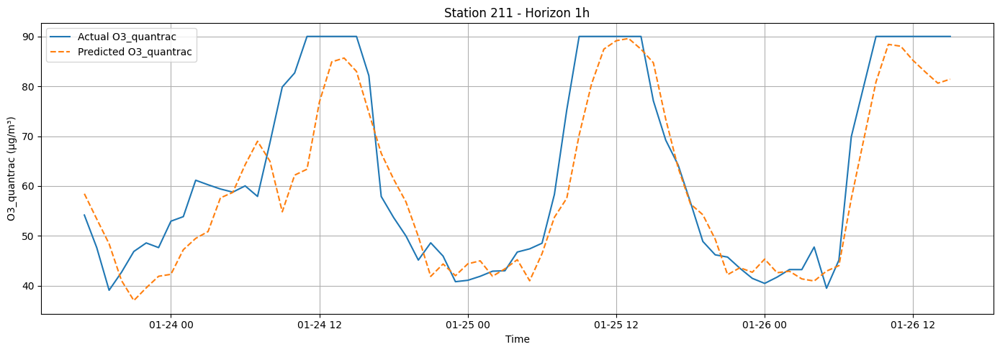

hour = 24


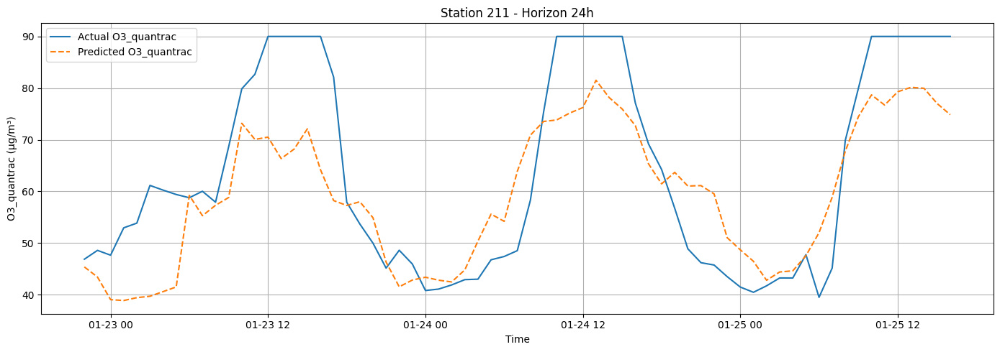

hour = 48


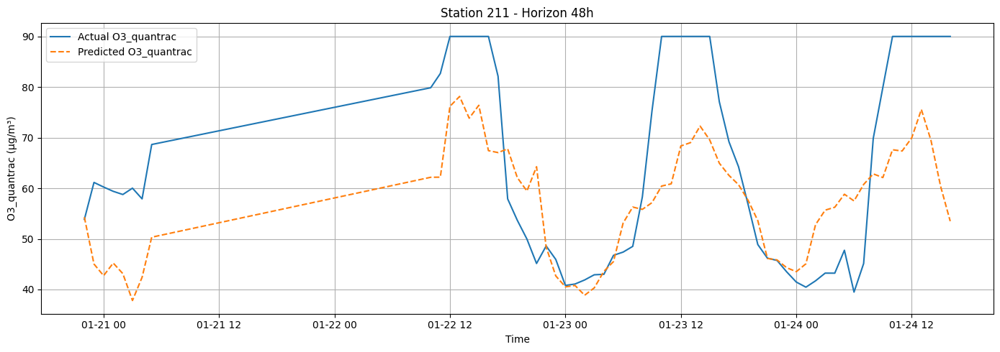

hour = 72


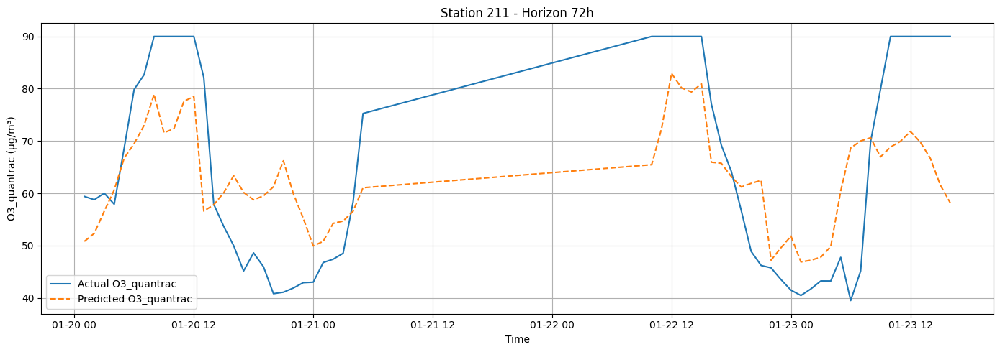

station_id = 212
hour = 1


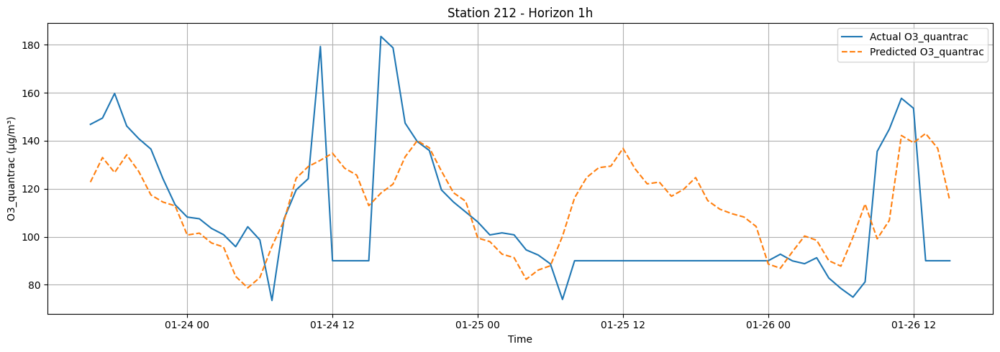

hour = 24


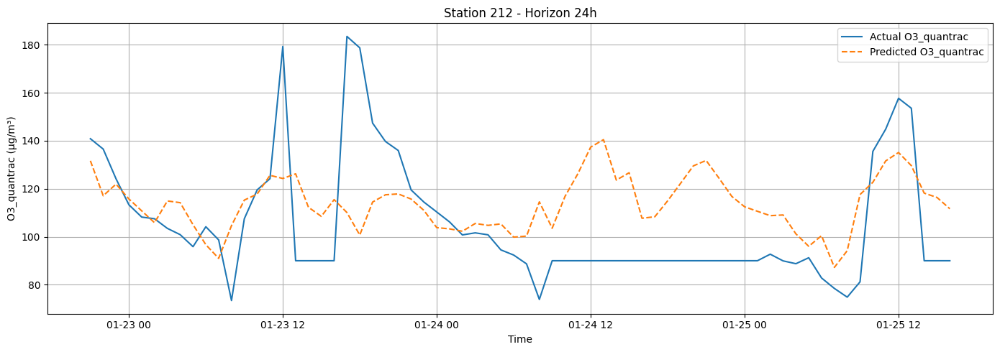

hour = 48


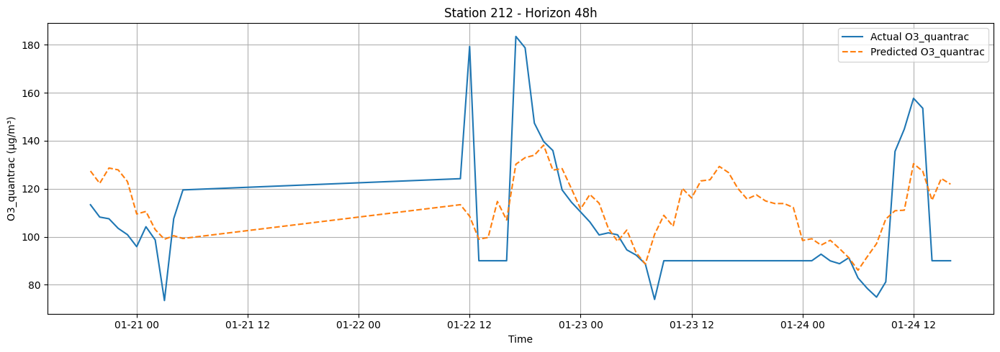

hour = 72


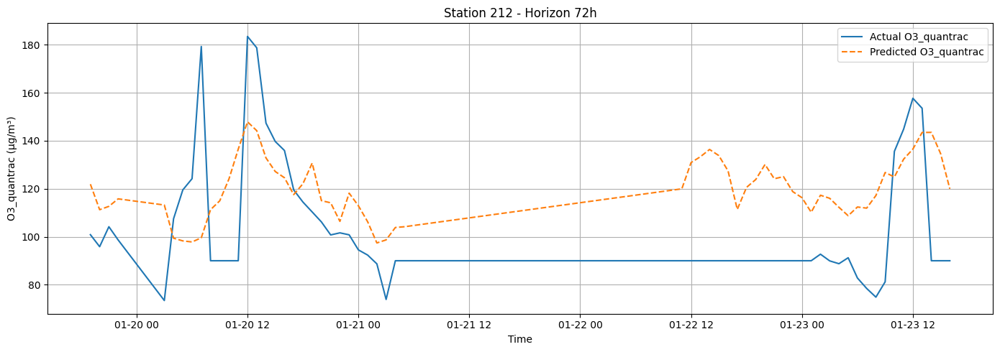

station_id = 213
hour = 1


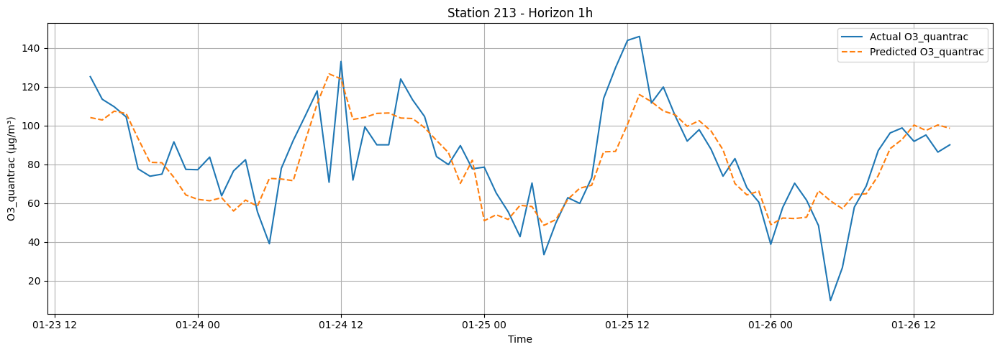

hour = 24


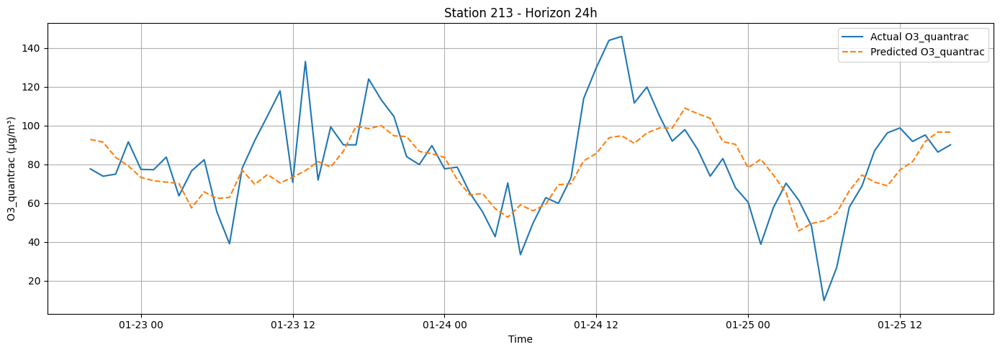

hour = 48


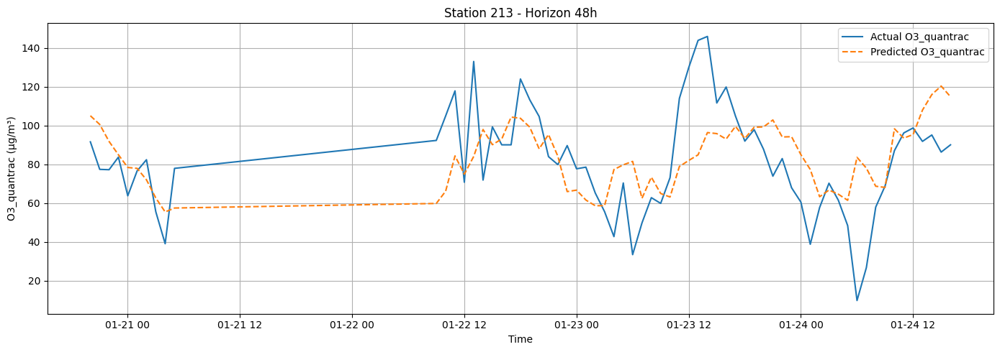

hour = 72


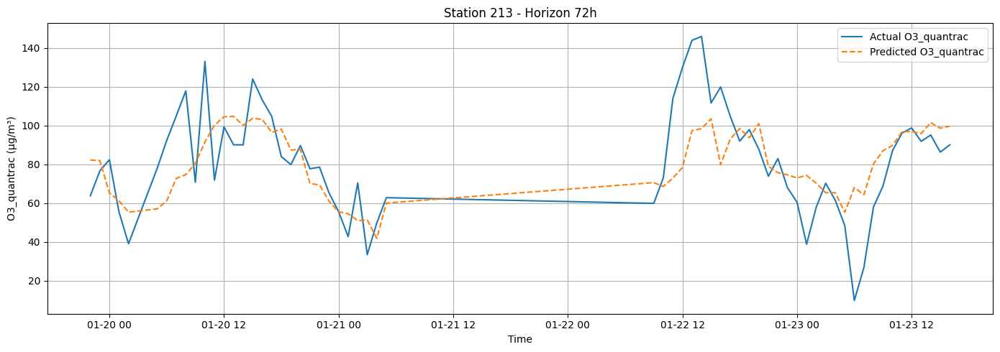

station_id = 216
hour = 1


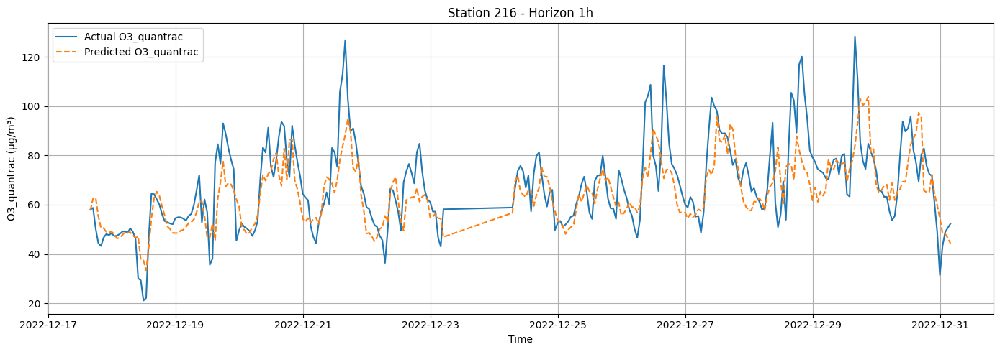

hour = 24


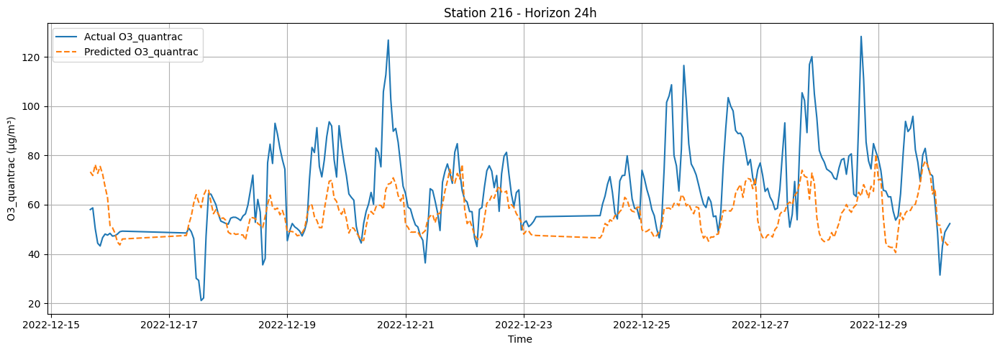

hour = 48


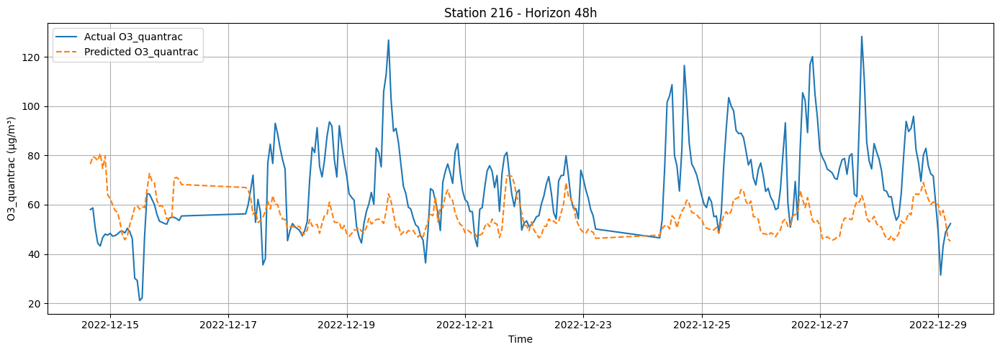

hour = 72


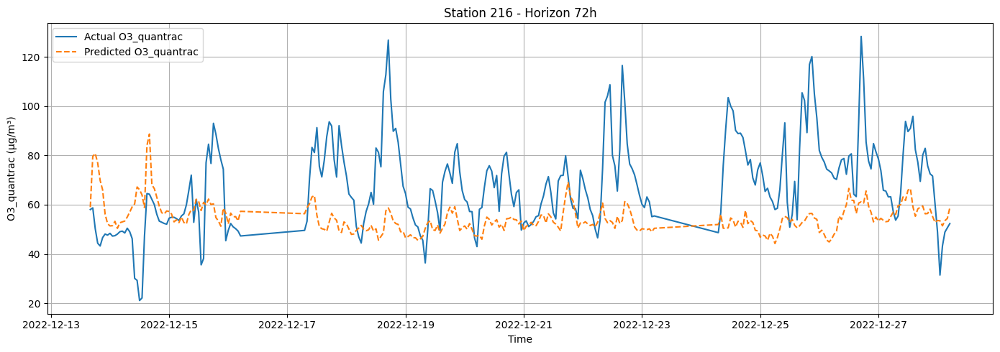

In [21]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [22]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all


===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (8080, 57)
y.shape = (8080, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_cmaq_lag3
SO2_cmaq_lag6
SO2_cmaq_lag12
SO2_cmaq_lag24
CO_quantrac_roll3_mean
CO_quantrac_roll3_std
CO_quantrac_roll

,date,target
0,2022-01-24,730.188709
1,2022-01-25,726.078542
2,2022-01-26,735.275817


,date,target
0,2022-01-24,744.616233
1,2022-01-25,748.882636
2,2022-01-26,745.283701


sid = 212, grp =                    date  station_id  y_true      y_pred
870 2022-01-23 16:00:00         212    90.0  104.740146
871 2022-01-23 17:00:00         212    90.0  133.061314
872 2022-01-23 18:00:00         212    90.0  102.675621
873 2022-01-23 19:00:00         212    90.0   52.769968
874 2022-01-23 20:00:00         212    90.0   62.875582
..                  ...         ...     ...         ...
937 2022-01-26 11:00:00         212     0.0   74.864439
938 2022-01-26 12:00:00         212     0.0   70.281698
939 2022-01-26 13:00:00         212    90.0   75.282041
940 2022-01-26 14:00:00         212    90.0  101.852221
941 2022-01-26 15:00:00         212    90.0  115.973690

[72 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 8
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of records = 24
Current date =

,date,target
0,2022-01-24,90.000
1,2022-01-25,90.000
2,2022-01-26,73.125


,date,target
0,2022-01-24,106.601814
1,2022-01-25,91.583009
2,2022-01-26,88.760458


sid = 213, grp =                     date  station_id       y_true       y_pred
1352 2022-01-23 15:00:00         213   875.544000  1020.350462
1353 2022-01-23 16:00:00         213   993.391000  1044.188850
1354 2022-01-23 17:00:00         213  1173.886000  1114.541366
1355 2022-01-23 18:00:00         213  1259.263000  1141.585312
1356 2022-01-23 19:00:00         213  1256.589000  1103.378914
...                  ...         ...          ...          ...
1420 2022-01-26 11:00:00         213   829.513000   872.244982
1421 2022-01-26 12:00:00         213   732.485000   820.657502
1422 2022-01-26 13:00:00         213   747.001000   888.409940
1423 2022-01-26 14:00:00         213  1143.517000   865.204621
1424 2022-01-26 15:00:00         213  1573.294286   969.565434

[73 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 9
Current date = 2022-01-24, num

,date,target
0,2022-01-24,889.395948
1,2022-01-25,1050.019481
2,2022-01-26,1049.143300


,date,target
0,2022-01-24,984.686394
1,2022-01-25,985.473676
2,2022-01-26,904.873949


sid = 216, grp =                     date  station_id       y_true       y_pred
7081 2022-11-12 18:00:00         216  1564.617467  1840.191685
7082 2022-11-12 19:00:00         216  1557.736667  1863.473343
7083 2022-11-12 20:00:00         216  1298.559867  1965.929877
7084 2022-11-12 21:00:00         216  1420.120667  1545.508187
7085 2022-11-12 22:00:00         216  1583.730800  1451.234308
...                  ...         ...          ...          ...
8075 2022-12-31 00:00:00         216   945.048148  1262.664435
8076 2022-12-31 01:00:00         216   822.974780   919.338482
8077 2022-12-31 02:00:00         216   855.703933   945.947775
8078 2022-12-31 03:00:00         216   708.340133   934.393093
8079 2022-12-31 04:00:00         216   712.736200   957.516163

[999 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(20

,date,target
0,2022-11-13,1921.745595
1,2022-11-14,2026.329407
2,2022-11-15,1610.506747
3,2022-11-16,1890.999392
4,2022-11-17,2043.596463
5,2022-11-19,1994.195255
6,2022-11-20,1044.054037
7,2022-11-21,1815.842549
8,2022-11-22,1833.806263
9,2022-11-23,1401.498884


,date,target
0,2022-11-13,1520.996937
1,2022-11-14,1703.368955
2,2022-11-15,1613.044884
3,2022-11-16,1764.258879
4,2022-11-17,1777.492956
5,2022-11-19,1628.582690
6,2022-11-20,1383.419479
7,2022-11-21,1588.446366
8,2022-11-22,1888.468357
9,2022-11-23,1797.225221


Overall test metrics: {'rmse': 585.16, 'mae': 385.94, 'mape': 27.61, 'mnbe': -9.35, 'r': 0.78, 'n_samples': 1215}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (7988, 57)
y.shape = (7988, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_

,date,target
0,2022-01-23,732.116218
1,2022-01-24,725.977471
2,2022-01-25,733.546575


,date,target
0,2022-01-23,800.455817
1,2022-01-24,798.896395
2,2022-01-25,796.198056


sid = 212, grp =                    date  station_id  y_true      y_pred
828 2022-01-22 21:00:00         212    90.0  198.405157
829 2022-01-22 22:00:00         212    90.0  209.030432
830 2022-01-22 23:00:00         212    90.0  209.030432
831 2022-01-23 00:00:00         212    90.0  209.030432
832 2022-01-23 01:00:00         212    90.0  209.030432
..                  ...         ...     ...         ...
891 2022-01-25 12:00:00         212     0.0  192.526604
892 2022-01-25 13:00:00         212     0.0  192.526604
893 2022-01-25 14:00:00         212    90.0  192.526604
894 2022-01-25 15:00:00         212    90.0  192.526604
895 2022-01-25 16:00:00         212    90.0  192.526604

[68 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 3
Current date = 2022-01-23, number of records = 24
Current date = 2022-01-24, number of records = 24
Current date =

,date,target
0,2022-01-23,90.000000
1,2022-01-24,90.000000
2,2022-01-25,74.117647


,date,target
0,2022-01-23,212.466932
1,2022-01-24,208.450600
2,2022-01-25,203.355755


sid = 213, grp =                     date  station_id       y_true       y_pred
1287 2022-01-22 20:00:00         213  1256.589000  1145.863473
1288 2022-01-22 21:00:00         213  1223.737000  1082.625875
1289 2022-01-22 22:00:00         213  1069.218000  1103.272215
1290 2022-01-22 23:00:00         213   861.792000  1157.647256
1291 2022-01-23 00:00:00         213   726.946000   965.093641
...                  ...         ...          ...          ...
1351 2022-01-25 12:00:00         213   829.513000  1077.600302
1352 2022-01-25 13:00:00         213   732.485000  1033.217854
1353 2022-01-25 14:00:00         213   747.001000  1040.704399
1354 2022-01-25 15:00:00         213  1143.517000  1039.334873
1355 2022-01-25 16:00:00         213  1573.294286  1076.882528

[69 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-22, number of records = 4
Current date = 2022-01-23, num

,date,target
0,2022-01-23,890.470323
1,2022-01-24,1045.316106
2,2022-01-25,1035.313812


,date,target
0,2022-01-23,1173.687469
1,2022-01-24,1202.050207
2,2022-01-25,1097.509295


sid = 216, grp =                     date  station_id       y_true       y_pred
6993 2022-11-11 05:00:00         216  1583.730800  1260.852836
6994 2022-11-12 00:00:00         216   881.506933   979.701924
6995 2022-11-12 01:00:00         216  3054.775936  1028.030557
6996 2022-11-12 02:00:00         216  2591.768000  1092.550911
6997 2022-11-12 03:00:00         216  2275.251200  1223.488906
...                  ...         ...          ...          ...
7983 2022-12-30 01:00:00         216   945.048148   949.807866
7984 2022-12-30 02:00:00         216   822.974780   905.175029
7985 2022-12-30 03:00:00         216   855.703933   802.142923
7986 2022-12-30 04:00:00         216   708.340133   796.164086
7987 2022-12-30 05:00:00         216   712.736200   899.198960

[995 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(20

,date,target
0,2022-11-12,1920.041322
1,2022-11-13,2005.374121
2,2022-11-14,1604.376847
3,2022-11-15,1907.930619
4,2022-11-16,1993.105408
5,2022-11-17,1879.621533
6,2022-11-19,1133.836663
7,2022-11-20,1790.477563
8,2022-11-21,1811.817966
9,2022-11-22,1441.915620


,date,target
0,2022-11-12,1365.933077
1,2022-11-13,1340.429987
2,2022-11-14,1469.614421
3,2022-11-15,1375.435232
4,2022-11-16,1345.001677
5,2022-11-17,1382.374931
6,2022-11-19,1379.192415
7,2022-11-20,1403.089960
8,2022-11-21,1490.928623
9,2022-11-22,1509.870174


Overall test metrics: {'rmse': 785.23, 'mae': 523.44, 'mape': 41.04, 'mnbe': -11.08, 'r': 0.6, 'n_samples': 1199}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (7892, 57)
y.shape = (7892, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2_

,date,target
0,2022-01-22,727.260616
1,2022-01-23,725.977471
2,2022-01-24,733.546575


,date,target
0,2022-01-22,824.164523
1,2022-01-23,828.240024
2,2022-01-24,822.463624


sid = 212, grp =                    date  station_id  y_true      y_pred
783 2022-01-20 19:00:00         212    90.0  243.538204
784 2022-01-20 20:00:00         212    90.0  243.538204
785 2022-01-20 21:00:00         212    90.0  243.538204
786 2022-01-20 22:00:00         212    90.0  243.538204
787 2022-01-20 23:00:00         212    90.0  243.538204
..                  ...         ...     ...         ...
843 2022-01-24 12:00:00         212     0.0  243.538204
844 2022-01-24 13:00:00         212     0.0  243.538204
845 2022-01-24 14:00:00         212    90.0  243.538204
846 2022-01-24 15:00:00         212    90.0  243.538204
847 2022-01-24 16:00:00         212    90.0  243.538204

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 5
Current date = 2022-01-21, number of records = 6
Current date = 2022-01-22, number of 

,date,target
0,2022-01-22,90.000000
1,2022-01-23,90.000000
2,2022-01-24,74.117647


,date,target
0,2022-01-22,243.839568
1,2022-01-23,244.027920
2,2022-01-24,243.538204


sid = 213, grp =                     date  station_id       y_true       y_pred
1218 2022-01-20 20:00:00         213   861.792000  1081.701366
1219 2022-01-20 21:00:00         213   726.946000  1049.870288
1220 2022-01-20 22:00:00         213   604.021035  1152.630074
1221 2022-01-20 23:00:00         213   587.516000  1081.995335
1222 2022-01-21 00:00:00         213   536.519000  1010.519588
...                  ...         ...          ...          ...
1279 2022-01-24 12:00:00         213   829.513000  1110.633207
1280 2022-01-24 13:00:00         213   732.485000  1218.158436
1281 2022-01-24 14:00:00         213   747.001000  1171.991018
1282 2022-01-24 15:00:00         213  1143.517000  1130.219960
1283 2022-01-24 16:00:00         213  1573.294286  1131.969786

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23), datetime.date(2022, 1, 24)]
Current date = 2022-01-20, number of records = 4
Cu

,date,target
0,2022-01-22,1073.556715
1,2022-01-23,1045.316106
2,2022-01-24,1035.313812


,date,target
0,2022-01-22,1152.344272
1,2022-01-23,1257.742839
2,2022-01-24,1224.236033


sid = 216, grp =                     date  station_id       y_true       y_pred
6900 2022-11-10 08:00:00         216  2591.768000  1722.547360
6901 2022-11-10 09:00:00         216  2275.251200  1399.200661
6902 2022-11-10 10:00:00         216  2242.949667  1545.447717
6903 2022-11-10 11:00:00         216  2221.351600  1536.885600
6904 2022-11-10 12:00:00         216  2456.063333  1333.353986
...                  ...         ...          ...          ...
7887 2022-12-29 01:00:00         216   945.048148  1063.996563
7888 2022-12-29 02:00:00         216   822.974780   971.237455
7889 2022-12-29 03:00:00         216   855.703933   988.578166
7890 2022-12-29 04:00:00         216   708.340133  1118.994513
7891 2022-12-29 05:00:00         216   712.736200  1335.650889

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(20

,date,target
0,2022-11-10,2038.389217
1,2022-11-12,2005.374121
2,2022-11-13,1604.376847
3,2022-11-14,1907.930619
4,2022-11-15,1993.105408
5,2022-11-16,1879.621533
6,2022-11-17,1044.054037
7,2022-11-19,2281.929624
8,2022-11-20,1811.817966
9,2022-11-21,1441.915620


,date,target
0,2022-11-10,1361.213272
1,2022-11-12,1269.083360
2,2022-11-13,1333.527951
3,2022-11-14,1344.803229
4,2022-11-15,1376.420188
5,2022-11-16,1276.434023
6,2022-11-17,1369.387885
7,2022-11-19,1390.719830
8,2022-11-20,1370.344364
9,2022-11-21,1425.394298


Overall test metrics: {'rmse': 849.65, 'mae': 573.96, 'mape': 45.04, 'mnbe': -10.75, 'r': 0.53, 'n_samples': 1186}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (7796, 57)
y.shape = (7796, 3)

Number of features: 57

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
NO2_cmaq_lag3
NO2_cmaq_lag6
NO2_cmaq_lag12
NO2_cmaq_lag24
O3_cmaq_lag3
O3_cmaq_lag6
O3_cmaq_lag12
O3_cmaq_lag24
SO2

,date,target
0,2022-01-20,726.432466
1,2022-01-22,732.130286
2,2022-01-23,733.546575


,date,target
0,2022-01-20,882.431054
1,2022-01-22,882.431054
2,2022-01-23,882.431054


sid = 212, grp =                    date  station_id  y_true      y_pred
739 2022-01-19 19:00:00         212    90.0  378.632399
740 2022-01-19 20:00:00         212    90.0  378.632399
741 2022-01-19 21:00:00         212    90.0  378.632399
742 2022-01-19 22:00:00         212    90.0  378.632399
743 2022-01-20 03:00:00         212    90.0  378.632399
..                  ...         ...     ...         ...
795 2022-01-23 12:00:00         212     0.0  378.632399
796 2022-01-23 13:00:00         212     0.0  378.632399
797 2022-01-23 14:00:00         212    90.0  378.632399
798 2022-01-23 15:00:00         212    90.0  378.632399
799 2022-01-23 16:00:00         212    90.0  378.632399

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 4
Current date = 2022-01-20, number of records = 21
Current date = 2022-01-21, number of

,date,target
0,2022-01-20,90.000000
1,2022-01-22,90.000000
2,2022-01-23,74.117647


,date,target
0,2022-01-20,378.632399
1,2022-01-22,378.632399
2,2022-01-23,378.632399


sid = 213, grp =                     date  station_id       y_true       y_pred
1150 2022-01-19 22:00:00         213   536.519000  1090.094395
1151 2022-01-19 23:00:00         213   535.373000  1081.065142
1152 2022-01-20 00:00:00         213   780.617000  1060.960326
1153 2022-01-20 01:00:00         213  1316.945000  1007.925550
1154 2022-01-20 02:00:00         213    90.000000  1003.293595
...                  ...         ...          ...          ...
1207 2022-01-23 12:00:00         213   829.513000  1150.779540
1208 2022-01-23 13:00:00         213   732.485000  1109.657902
1209 2022-01-23 14:00:00         213   747.001000  1183.718310
1210 2022-01-23 15:00:00         213  1143.517000  1154.231748
1211 2022-01-23 16:00:00         213  1573.294286  1200.731467

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 19), datetime.date(2022, 1, 20), datetime.date(2022, 1, 21), datetime.date(2022, 1, 22), datetime.date(2022, 1, 23)]
Current date = 2022-01-19, number of records = 2
Cu

,date,target
0,2022-01-20,923.917058
1,2022-01-22,1089.018333
2,2022-01-23,1035.313812


,date,target
0,2022-01-20,1159.404758
1,2022-01-22,1150.823323
2,2022-01-23,1173.717264


sid = 216, grp =                     date  station_id       y_true       y_pred
6808 2022-11-09 12:00:00         216  2456.063333  1205.111958
6809 2022-11-09 13:00:00         216  3243.723800  1093.542880
6810 2022-11-09 14:00:00         216  2903.315333  1158.298147
6811 2022-11-09 15:00:00         216  2083.735600  1144.965053
6812 2022-11-09 16:00:00         216  1510.526733  1280.022152
...                  ...         ...          ...          ...
7791 2022-12-28 01:00:00         216   945.048148  1355.599053
7792 2022-12-28 02:00:00         216   822.974780  1321.093727
7793 2022-12-28 03:00:00         216   855.703933  1339.619968
7794 2022-12-28 04:00:00         216   708.340133  1306.031575
7795 2022-12-28 05:00:00         216   712.736200  1372.132890

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(202

,date,target
0,2022-11-09,1940.242250
1,2022-11-10,1767.442988
2,2022-11-12,1604.376847
3,2022-11-13,1907.930619
4,2022-11-14,1993.105408
5,2022-11-15,1879.621533
6,2022-11-16,1044.054037
7,2022-11-17,1815.842549
8,2022-11-19,2205.619108
9,2022-11-20,1441.915620


,date,target
0,2022-11-09,1308.603995
1,2022-11-10,1343.245869
2,2022-11-12,1315.901658
3,2022-11-13,1344.153844
4,2022-11-14,1348.764919
5,2022-11-15,1370.542630
6,2022-11-16,1327.130869
7,2022-11-17,1371.318135
8,2022-11-19,1344.802112
9,2022-11-20,1332.307513


Overall test metrics: {'rmse': 875.76, 'mae': 604.21, 'mape': 53.55, 'mnbe': -17.89, 'r': 0.5, 'n_samples': 1171}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,26.76,21.75,2.99,-2.27,0.47,71,-2.16
4,211,24,72.68,69.43,9.59,-9.44,-0.02,67,-9.31
8,211,48,98.12,94.99,13.13,-13.07,-0.13,63,-13.18
12,211,72,154.62,152.69,21.05,-21.05,NaN,60,-20.77
1,212,1,33.11,25.36,25.68,-5.73,0.12,72,-13.86
5,212,24,123.99,122.43,132.44,-132.44,0.26,68,-147.35
9,212,48,159.05,157.93,170.88,-170.88,0.06,65,-190.22
13,212,72,293.70,293.06,320.70,-320.70,NaN,61,-350.75
2,213,1,326.91,227.71,60.02,-42.20,0.37,73,3.06
6,213,24,436.68,350.08,90.34,-77.88,-0.30,69,-17.60


station_id = 211
hour = 1


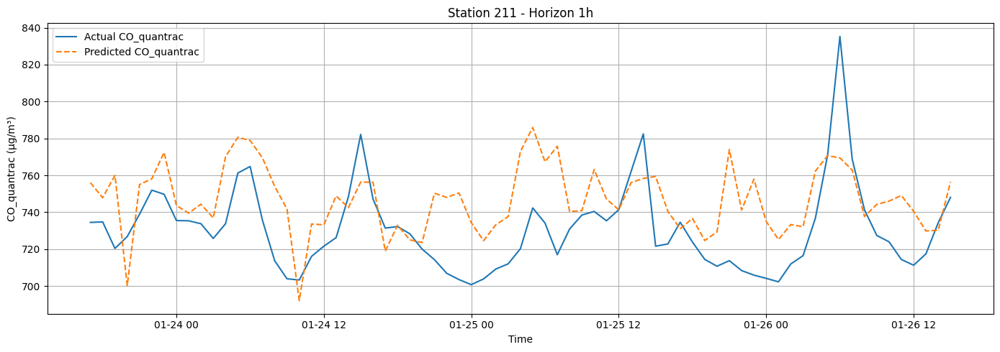

hour = 24


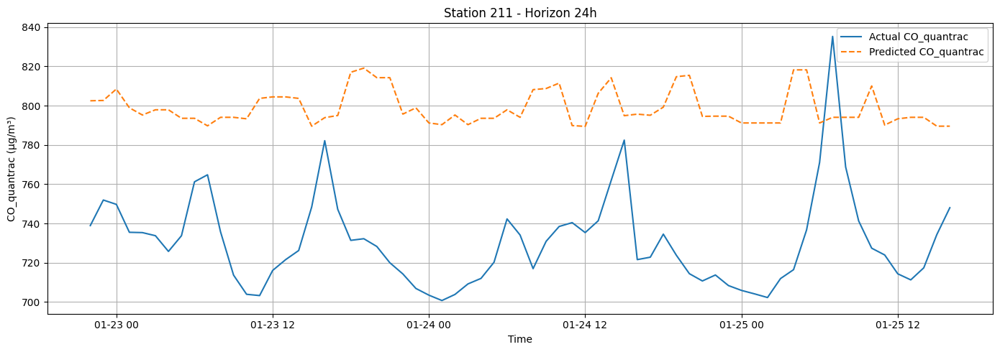

hour = 48


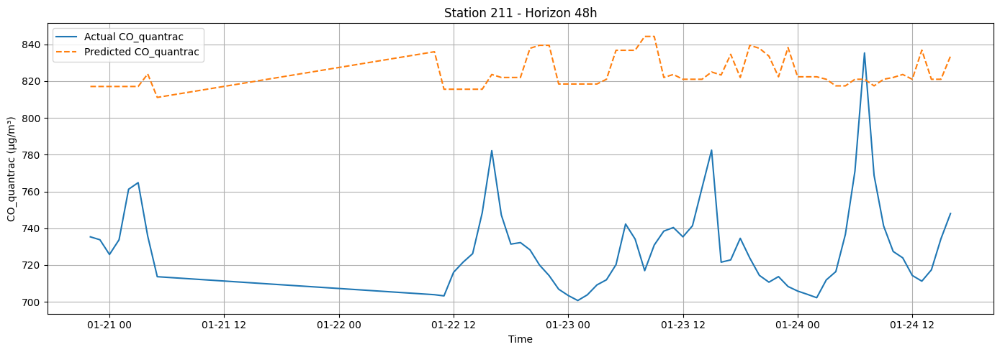

hour = 72


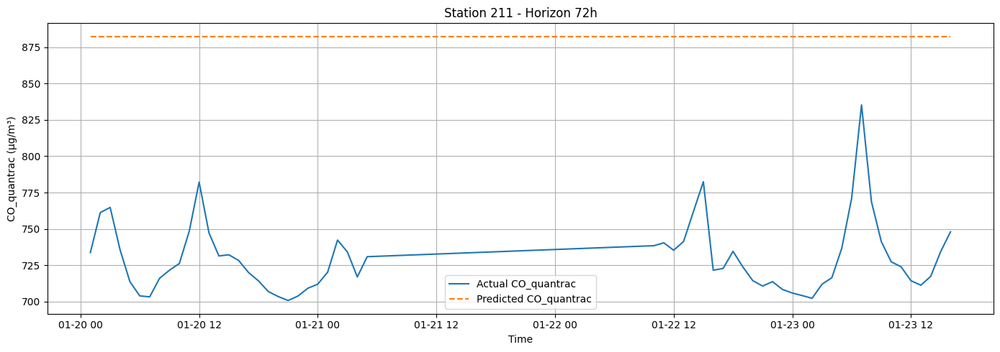

station_id = 212
hour = 1


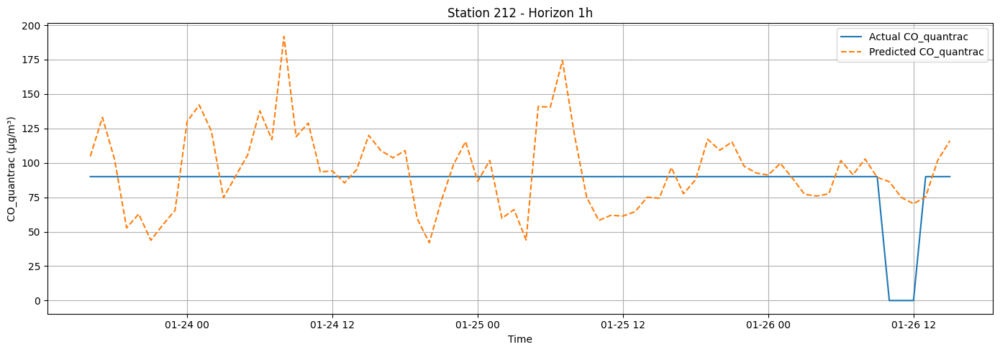

hour = 24


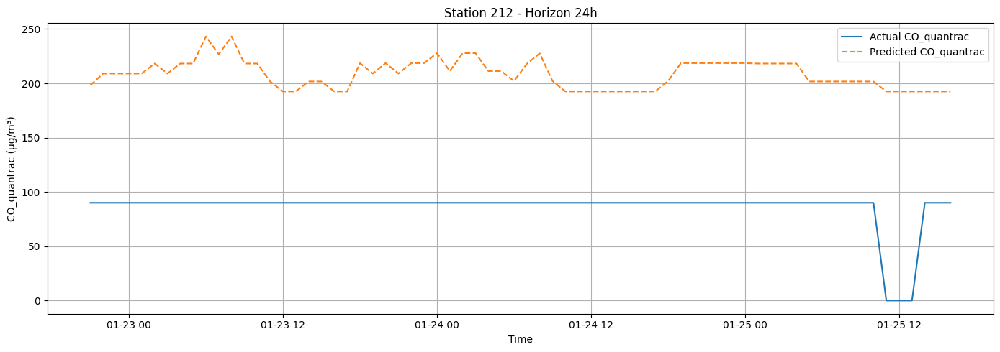

hour = 48


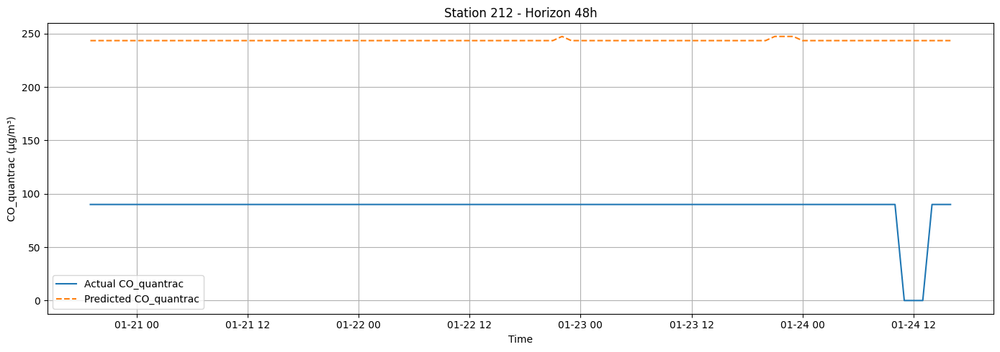

hour = 72


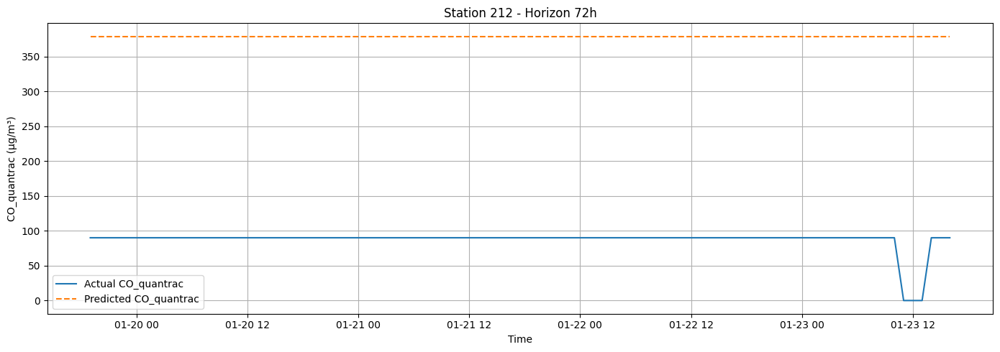

station_id = 213
hour = 1


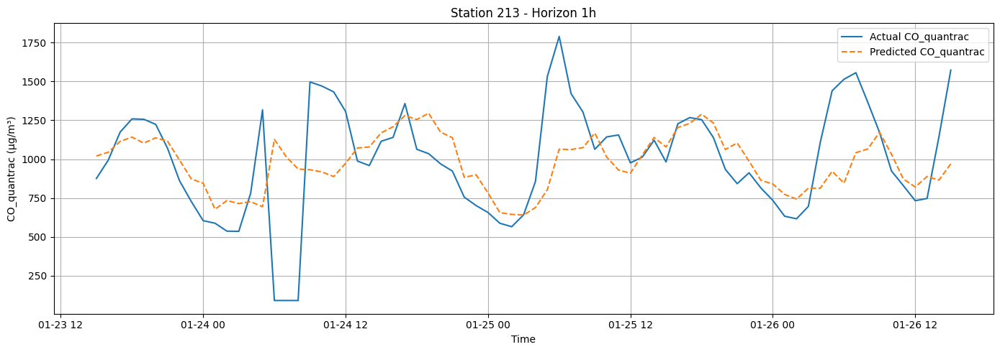

hour = 24


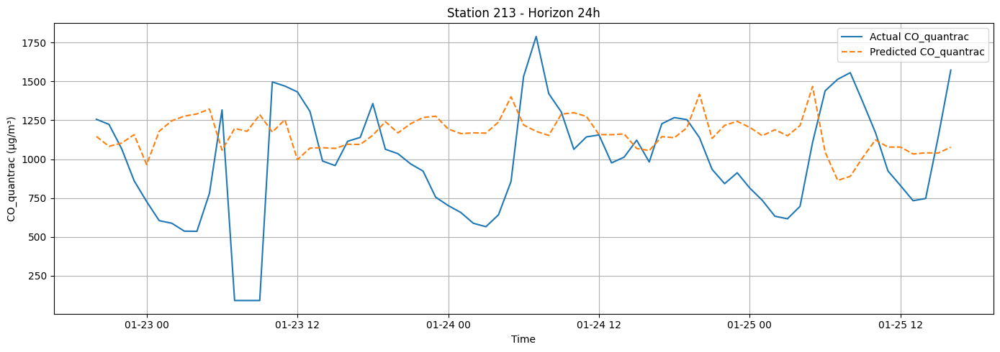

hour = 48


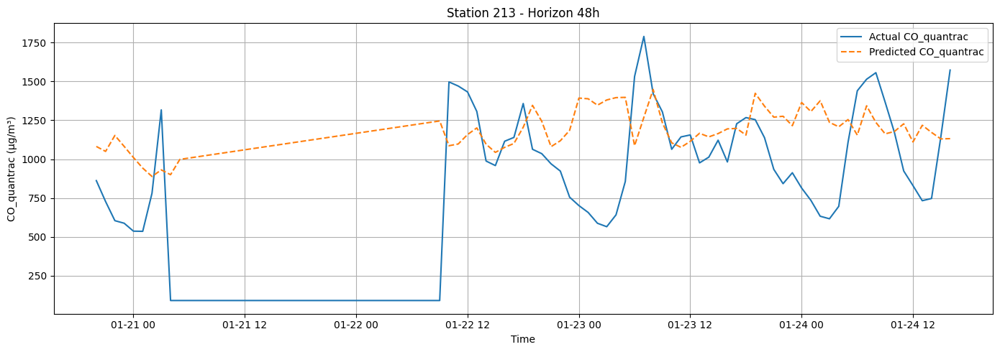

hour = 72


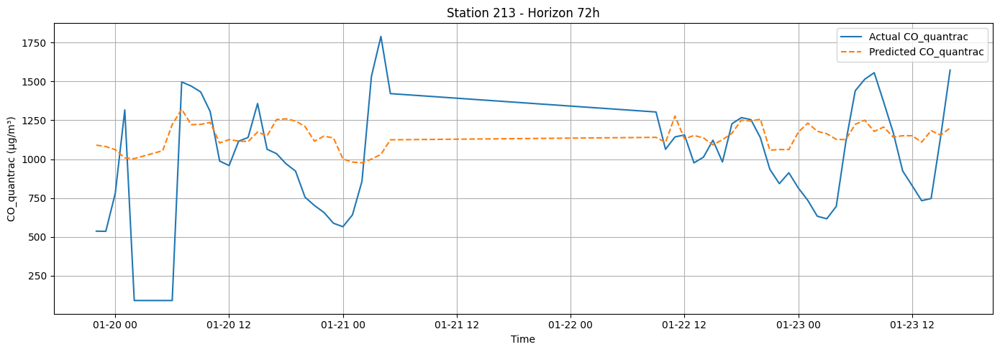

station_id = 216
hour = 1


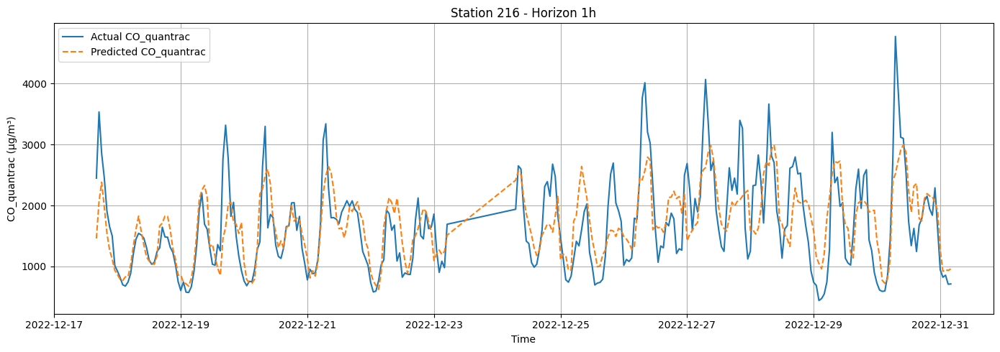

hour = 24


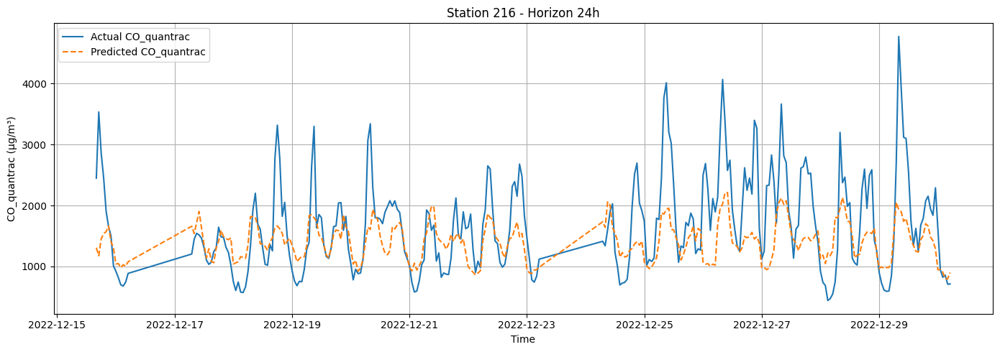

hour = 48


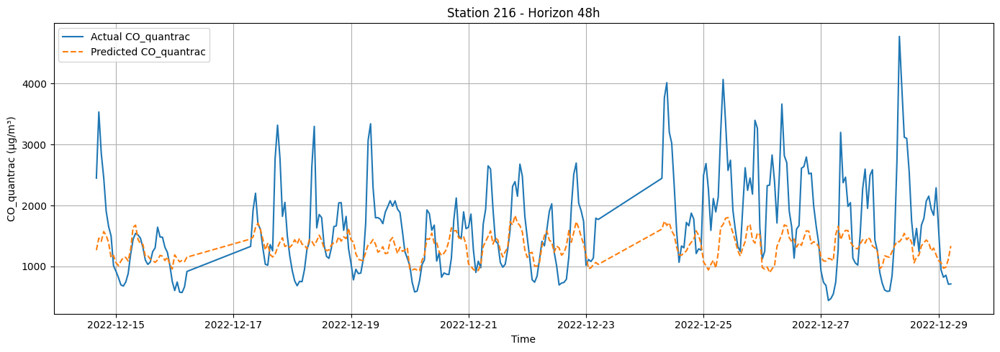

hour = 72


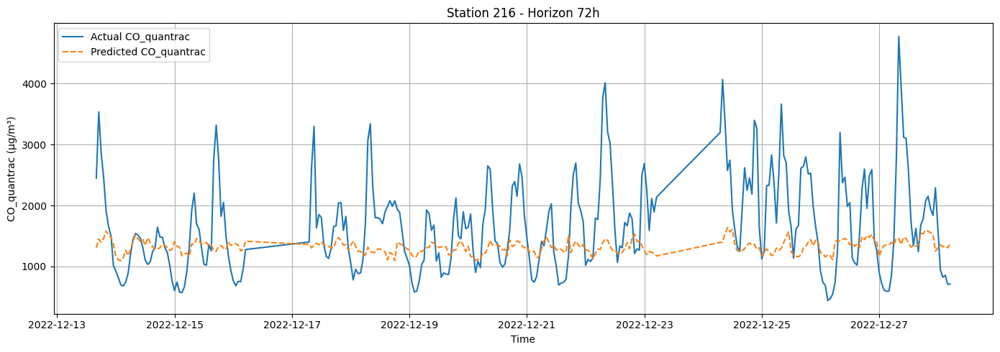

In [23]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)